# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [6, 48]
dtc_w1 = 25
dtc_w2 = 2.5

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.5, 
    limit_val_batches=0.5,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=None,
    model_level_metrics_helper_covariates=None
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 39wiq53i
Name: dark-sky-595
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/39wiq53i
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240506_222759-39wiq53i/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 220,366,442,196,386,279,574,138,480,355,419,372,249,290,46,217,445,286,274,539,235,272,138,50,333,150,111,303,108,81,182,200,53,332,232,174,273,145,98,193,379,449,328,987,149,387,171,183,271,321,228,145,377,275,265,387,299,632,312,296,236,592,252,145,252,347,288,711,347,367,266,368,360,353,129,223,217,147,61,122,189,508,309,265,354,211,154,236,396,185,133,109,251,397,157,163,446,77,155,295,180,379,101,240,187,225,342,130,148,292,267,113,111,358,341,354,247,43,47,207,230,251,75,203,308,252,190,245,299,213,952,269,196,511,299,153,501,344,508,469,204,464,471,261,368,240,347,237,294,289,271,238,252,405,395,242,230,187,161,633,249,244,144,153,175,164,537,255,386,197,279,409,593,413,304,262,231,233,171,188,204,194,217,250,598,345,321,367,361,7087,408,282,194,170,358,174,274,256,161,3

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 56,115,116,36,109,100,113,37,102,108,114,92,52,68,13,47,117,79,74,124,71,63,50,14,77,34,23,61,18,26,48,45,11,80,54,37,58,35,16,44,89,117,87,232,30,88,44,58,84,77,57,33,93,53,64,91,88,155,70,70,54,139,45,38,70,78,66,194,94,78,58,91,91,92,30,61,60,44,10,29,58,122,73,80,72,61,38,59,83,31,42,21,78,97,35,37,106,19,38,73,35,84,25,63,50,49,68,37,35,76,82,27,30,87,86,90,80,11,12,59,48,78,21,51,87,59,47,53,62,50,245,68,45,136,76,39,122,88,118,112,57,107,108,77,83,60,97,65,69,77,68,64,67,95,102,71,68,50,31,137,61,49,32,33,40,38,130,60,94,72,66,103,157,100,68,60,53,58,47,34,60,42,38,55,165,89,91,79,102,1820,122,67,51,41,88,43,57,76,39,76,29,78,69,84,79,127,66,58,94,19,18,51,60,65,13,71,76,92,38,45,54,80,69,62,64,47,59,59,54,56,77,106,51,83,13,55,35,119,132,133,107,77,61,59,198,111,23,60

Epoch 1/600:   0%|          | 1/600 [00:19<3:10:12, 19.05s/it]

Epoch 1/600:   0%|          | 1/600 [00:19<3:10:12, 19.05s/it, v_num=3i_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 2/600:   0%|          | 1/600 [00:19<3:10:12, 19.05s/it, v_num=3i_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 2/600:   0%|          | 2/600 [00:25<1:55:19, 11.57s/it, v_num=3i_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 2/600:   0%|          | 2/600 [00:25<1:55:19, 11.57s/it, v_num=3i_1, total_loss_train=1.35e+3, kl_local_train=74.1]

Epoch 3/600:   0%|          | 2/600 [00:25<1:55:19, 11.57s/it, v_num=3i_1, total_loss_train=1.35e+3, kl_local_train=74.1]

Epoch 3/600:   0%|          | 3/600 [00:31<1:31:18,  9.18s/it, v_num=3i_1, total_loss_train=1.35e+3, kl_local_train=74.1]

Epoch 3/600:   0%|          | 3/600 [00:31<1:31:18,  9.18s/it, v_num=3i_1, total_loss_train=1.33e+3, kl_local_train=70.3]

Epoch 4/600:   0%|          | 3/600 [00:31<1:31:18,  9.18s/it, v_num=3i_1, total_loss_train=1.33e+3, kl_local_train=70.3]

Epoch 4/600:   1%|          | 4/600 [00:38<1:19:53,  8.04s/it, v_num=3i_1, total_loss_train=1.33e+3, kl_local_train=70.3]

Epoch 4/600:   1%|          | 4/600 [00:38<1:19:53,  8.04s/it, v_num=3i_1, total_loss_train=1.32e+3, kl_local_train=60]  

Epoch 5/600:   1%|          | 4/600 [00:38<1:19:53,  8.04s/it, v_num=3i_1, total_loss_train=1.32e+3, kl_local_train=60]

Epoch 5/600:   1%|          | 5/600 [00:44<1:13:32,  7.42s/it, v_num=3i_1, total_loss_train=1.32e+3, kl_local_train=60]

Epoch 5/600:   1%|          | 5/600 [00:44<1:13:32,  7.42s/it, v_num=3i_1, total_loss_train=1.32e+3, kl_local_train=43.8]

Epoch 6/600:   1%|          | 5/600 [00:44<1:13:32,  7.42s/it, v_num=3i_1, total_loss_train=1.32e+3, kl_local_train=43.8]

Epoch 6/600:   1%|          | 6/600 [00:50<1:09:41,  7.04s/it, v_num=3i_1, total_loss_train=1.32e+3, kl_local_train=43.8]

Epoch 6/600:   1%|          | 6/600 [00:50<1:09:41,  7.04s/it, v_num=3i_1, total_loss_train=1.31e+3, kl_local_train=29.3]

Epoch 7/600:   1%|          | 6/600 [00:50<1:09:41,  7.04s/it, v_num=3i_1, total_loss_train=1.31e+3, kl_local_train=29.3]

Epoch 7/600:   1%|          | 7/600 [00:56<1:07:18,  6.81s/it, v_num=3i_1, total_loss_train=1.31e+3, kl_local_train=29.3]

Epoch 7/600:   1%|          | 7/600 [00:56<1:07:18,  6.81s/it, v_num=3i_1, total_loss_train=1.29e+3, kl_local_train=37.5]

Epoch 8/600:   1%|          | 7/600 [00:56<1:07:18,  6.81s/it, v_num=3i_1, total_loss_train=1.29e+3, kl_local_train=37.5]

Epoch 8/600:   1%|▏         | 8/600 [01:03<1:05:39,  6.66s/it, v_num=3i_1, total_loss_train=1.29e+3, kl_local_train=37.5]

Epoch 8/600:   1%|▏         | 8/600 [01:03<1:05:39,  6.66s/it, v_num=3i_1, total_loss_train=1.28e+3, kl_local_train=43.6]

Epoch 9/600:   1%|▏         | 8/600 [01:03<1:05:39,  6.66s/it, v_num=3i_1, total_loss_train=1.28e+3, kl_local_train=43.6]

Epoch 9/600:   2%|▏         | 9/600 [01:09<1:04:34,  6.56s/it, v_num=3i_1, total_loss_train=1.28e+3, kl_local_train=43.6]

Epoch 9/600:   2%|▏         | 9/600 [01:09<1:04:34,  6.56s/it, v_num=3i_1, total_loss_train=1.28e+3, kl_local_train=46.2]

Epoch 10/600:   2%|▏         | 9/600 [01:09<1:04:34,  6.56s/it, v_num=3i_1, total_loss_train=1.28e+3, kl_local_train=46.2]

Epoch 10/600:   2%|▏         | 10/600 [01:15<1:03:51,  6.49s/it, v_num=3i_1, total_loss_train=1.28e+3, kl_local_train=46.2]

Epoch 10/600:   2%|▏         | 10/600 [01:15<1:03:51,  6.49s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=51.7]

Epoch 11/600:   2%|▏         | 10/600 [01:15<1:03:51,  6.49s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=51.7]

Epoch 11/600:   2%|▏         | 11/600 [01:22<1:03:22,  6.46s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=51.7]

Epoch 11/600:   2%|▏         | 11/600 [01:22<1:03:22,  6.46s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=56.8]

Epoch 12/600:   2%|▏         | 11/600 [01:22<1:03:22,  6.46s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=56.8]

Epoch 12/600:   2%|▏         | 12/600 [01:28<1:02:59,  6.43s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=56.8]

Epoch 12/600:   2%|▏         | 12/600 [01:28<1:02:59,  6.43s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 13/600:   2%|▏         | 12/600 [01:28<1:02:59,  6.43s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 13/600:   2%|▏         | 13/600 [01:35<1:02:34,  6.40s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=58.7]

Epoch 13/600:   2%|▏         | 13/600 [01:35<1:02:34,  6.40s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=63.2]

Epoch 14/600:   2%|▏         | 13/600 [01:35<1:02:34,  6.40s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=63.2]

Epoch 14/600:   2%|▏         | 14/600 [01:41<1:02:12,  6.37s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=63.2]

Epoch 14/600:   2%|▏         | 14/600 [01:41<1:02:12,  6.37s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=67.3]

Epoch 15/600:   2%|▏         | 14/600 [01:41<1:02:12,  6.37s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=67.3]

Epoch 15/600:   2%|▎         | 15/600 [01:47<1:02:03,  6.37s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=67.3]

Epoch 15/600:   2%|▎         | 15/600 [01:47<1:02:03,  6.37s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=68.9]

Epoch 16/600:   2%|▎         | 15/600 [01:47<1:02:03,  6.37s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=68.9]

Epoch 16/600:   3%|▎         | 16/600 [01:54<1:01:49,  6.35s/it, v_num=3i_1, total_loss_train=1.27e+3, kl_local_train=68.9]

Epoch 16/600:   3%|▎         | 16/600 [01:54<1:01:49,  6.35s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=71.9]

Epoch 17/600:   3%|▎         | 16/600 [01:54<1:01:49,  6.35s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=71.9]

Epoch 17/600:   3%|▎         | 17/600 [02:00<1:01:37,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=71.9]

Epoch 17/600:   3%|▎         | 17/600 [02:00<1:01:37,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=77.7]

Epoch 18/600:   3%|▎         | 17/600 [02:00<1:01:37,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=77.7]

Epoch 18/600:   3%|▎         | 18/600 [02:06<1:01:26,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=77.7]

Epoch 18/600:   3%|▎         | 18/600 [02:06<1:01:26,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=83.3]

Epoch 19/600:   3%|▎         | 18/600 [02:06<1:01:26,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=83.3]

Epoch 19/600:   3%|▎         | 19/600 [02:13<1:01:30,  6.35s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=83.3]

Epoch 19/600:   3%|▎         | 19/600 [02:13<1:01:30,  6.35s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=86.8]

Epoch 20/600:   3%|▎         | 19/600 [02:13<1:01:30,  6.35s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=86.8]

Epoch 20/600:   3%|▎         | 20/600 [02:19<1:01:23,  6.35s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=86.8]

Epoch 20/600:   3%|▎         | 20/600 [02:19<1:01:23,  6.35s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=88.5]

Epoch 21/600:   3%|▎         | 20/600 [02:19<1:01:23,  6.35s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=88.5]

Epoch 21/600:   4%|▎         | 21/600 [02:25<1:01:11,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=88.5]

Epoch 21/600:   4%|▎         | 21/600 [02:25<1:01:11,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=92.8]

Epoch 22/600:   4%|▎         | 21/600 [02:25<1:01:11,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=92.8]

Epoch 22/600:   4%|▎         | 22/600 [02:32<1:01:00,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=92.8]

Epoch 22/600:   4%|▎         | 22/600 [02:32<1:01:00,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=93.1]

Epoch 23/600:   4%|▎         | 22/600 [02:32<1:01:00,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=93.1]

Epoch 23/600:   4%|▍         | 23/600 [02:38<1:00:54,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=93.1]

Epoch 23/600:   4%|▍         | 23/600 [02:38<1:00:54,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=96.1]

Epoch 24/600:   4%|▍         | 23/600 [02:38<1:00:54,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=96.1]

Epoch 24/600:   4%|▍         | 24/600 [02:44<1:00:52,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=96.1]

Epoch 24/600:   4%|▍         | 24/600 [02:44<1:00:52,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=99]  

Epoch 25/600:   4%|▍         | 24/600 [02:44<1:00:52,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=99]

Epoch 25/600:   4%|▍         | 25/600 [02:51<1:00:43,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=99]

Epoch 25/600:   4%|▍         | 25/600 [02:51<1:00:43,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=96.5]

Epoch 26/600:   4%|▍         | 25/600 [02:51<1:00:43,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=96.5]

Epoch 26/600:   4%|▍         | 26/600 [02:57<1:00:38,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=96.5]

Epoch 26/600:   4%|▍         | 26/600 [02:57<1:00:38,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=91.2]

Epoch 27/600:   4%|▍         | 26/600 [02:57<1:00:38,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=91.2]

Epoch 27/600:   4%|▍         | 27/600 [03:03<1:00:27,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=91.2]

Epoch 27/600:   4%|▍         | 27/600 [03:03<1:00:27,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=92.7]

Epoch 28/600:   4%|▍         | 27/600 [03:03<1:00:27,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=92.7]

Epoch 28/600:   5%|▍         | 28/600 [03:10<1:00:21,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=92.7]

Epoch 28/600:   5%|▍         | 28/600 [03:10<1:00:21,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=88.1]

Epoch 29/600:   5%|▍         | 28/600 [03:10<1:00:21,  6.33s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=88.1]

Epoch 29/600:   5%|▍         | 29/600 [03:16<1:00:21,  6.34s/it, v_num=3i_1, total_loss_train=1.26e+3, kl_local_train=88.1]

Epoch 29/600:   5%|▍         | 29/600 [03:16<1:00:21,  6.34s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=88.7]

Epoch 30/600:   5%|▍         | 29/600 [03:16<1:00:21,  6.34s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=88.7]

Epoch 30/600:   5%|▌         | 30/600 [03:22<1:00:10,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=88.7]

Epoch 30/600:   5%|▌         | 30/600 [03:22<1:00:10,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=89.7]

Epoch 31/600:   5%|▌         | 30/600 [03:22<1:00:10,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=89.7]

Epoch 31/600:   5%|▌         | 31/600 [03:29<1:00:01,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=89.7]

Epoch 31/600:   5%|▌         | 31/600 [03:29<1:00:01,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=91.9]

Epoch 32/600:   5%|▌         | 31/600 [03:29<1:00:01,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=91.9]

Epoch 32/600:   5%|▌         | 32/600 [03:35<59:54,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=91.9]  

Epoch 32/600:   5%|▌         | 32/600 [03:35<59:54,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=96.2]

Epoch 33/600:   5%|▌         | 32/600 [03:35<59:54,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=96.2]

Epoch 33/600:   6%|▌         | 33/600 [03:41<59:48,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=96.2]

Epoch 33/600:   6%|▌         | 33/600 [03:41<59:48,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=97.5]

Epoch 34/600:   6%|▌         | 33/600 [03:41<59:48,  6.33s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=97.5]

Epoch 34/600:   6%|▌         | 34/600 [03:48<1:00:11,  6.38s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=97.5]

Epoch 34/600:   6%|▌         | 34/600 [03:48<1:00:11,  6.38s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=98.4]

Epoch 35/600:   6%|▌         | 34/600 [03:48<1:00:11,  6.38s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=98.4]

Epoch 35/600:   6%|▌         | 35/600 [03:54<1:00:14,  6.40s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=98.4]

Epoch 35/600:   6%|▌         | 35/600 [03:54<1:00:14,  6.40s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=101] 

Epoch 36/600:   6%|▌         | 35/600 [03:54<1:00:14,  6.40s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=101]

Epoch 36/600:   6%|▌         | 36/600 [04:01<1:00:11,  6.40s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=101]

Epoch 36/600:   6%|▌         | 36/600 [04:01<1:00:11,  6.40s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=102]

Epoch 37/600:   6%|▌         | 36/600 [04:01<1:00:11,  6.40s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=102]

Epoch 37/600:   6%|▌         | 37/600 [04:07<1:00:17,  6.43s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=102]

Epoch 37/600:   6%|▌         | 37/600 [04:07<1:00:17,  6.43s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=103]

Epoch 38/600:   6%|▌         | 37/600 [04:07<1:00:17,  6.43s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=103]

Epoch 38/600:   6%|▋         | 38/600 [04:13<59:56,  6.40s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=103]  

Epoch 38/600:   6%|▋         | 38/600 [04:13<59:56,  6.40s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 39/600:   6%|▋         | 38/600 [04:13<59:56,  6.40s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 39/600:   6%|▋         | 39/600 [04:20<59:51,  6.40s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 39/600:   6%|▋         | 39/600 [04:20<59:51,  6.40s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 40/600:   6%|▋         | 39/600 [04:20<59:51,  6.40s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 40/600:   7%|▋         | 40/600 [04:26<59:42,  6.40s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 40/600:   7%|▋         | 40/600 [04:26<59:42,  6.40s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=101]

Epoch 41/600:   7%|▋         | 40/600 [04:26<59:42,  6.40s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=101]

Epoch 41/600:   7%|▋         | 41/600 [04:33<59:28,  6.38s/it, v_num=3i_1, total_loss_train=1.25e+3, kl_local_train=101]

Epoch 41/600:   7%|▋         | 41/600 [04:33<59:28,  6.38s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 42/600:   7%|▋         | 41/600 [04:33<59:28,  6.38s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 42/600:   7%|▋         | 42/600 [04:39<59:17,  6.37s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 42/600:   7%|▋         | 42/600 [04:39<59:17,  6.37s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 43/600:   7%|▋         | 42/600 [04:39<59:17,  6.37s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 43/600:   7%|▋         | 43/600 [04:45<59:08,  6.37s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 43/600:   7%|▋         | 43/600 [04:45<59:08,  6.37s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 44/600:   7%|▋         | 43/600 [04:45<59:08,  6.37s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 44/600:   7%|▋         | 44/600 [04:52<58:52,  6.35s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 44/600:   7%|▋         | 44/600 [04:52<58:52,  6.35s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=106]

Epoch 45/600:   7%|▋         | 44/600 [04:52<58:52,  6.35s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=106]

Epoch 45/600:   8%|▊         | 45/600 [04:58<58:42,  6.35s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=106]

Epoch 45/600:   8%|▊         | 45/600 [04:58<58:42,  6.35s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 46/600:   8%|▊         | 45/600 [04:58<58:42,  6.35s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 46/600:   8%|▊         | 46/600 [05:04<58:31,  6.34s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 46/600:   8%|▊         | 46/600 [05:04<58:31,  6.34s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 47/600:   8%|▊         | 46/600 [05:04<58:31,  6.34s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 47/600:   8%|▊         | 47/600 [05:11<58:26,  6.34s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 47/600:   8%|▊         | 47/600 [05:11<58:26,  6.34s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 48/600:   8%|▊         | 47/600 [05:11<58:26,  6.34s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 48/600:   8%|▊         | 48/600 [05:17<58:17,  6.34s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 48/600:   8%|▊         | 48/600 [05:17<58:17,  6.34s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=106]

Epoch 49/600:   8%|▊         | 48/600 [05:17<58:17,  6.34s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=106]

Epoch 49/600:   8%|▊         | 49/600 [05:23<58:09,  6.33s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=106]

Epoch 49/600:   8%|▊         | 49/600 [05:23<58:09,  6.33s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 50/600:   8%|▊         | 49/600 [05:23<58:09,  6.33s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 50/600:   8%|▊         | 50/600 [05:29<57:57,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 50/600:   8%|▊         | 50/600 [05:29<57:57,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 51/600:   8%|▊         | 50/600 [05:30<57:57,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 51/600:   8%|▊         | 51/600 [05:36<57:54,  6.33s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 51/600:   8%|▊         | 51/600 [05:36<57:54,  6.33s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 52/600:   8%|▊         | 51/600 [05:36<57:54,  6.33s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 52/600:   9%|▊         | 52/600 [05:42<57:43,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=104]

Epoch 52/600:   9%|▊         | 52/600 [05:42<57:43,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 53/600:   9%|▊         | 52/600 [05:42<57:43,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 53/600:   9%|▉         | 53/600 [05:48<57:37,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=105]

Epoch 53/600:   9%|▉         | 53/600 [05:48<57:37,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 54/600:   9%|▉         | 53/600 [05:48<57:37,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 54/600:   9%|▉         | 54/600 [05:55<57:28,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=103]

Epoch 54/600:   9%|▉         | 54/600 [05:55<57:28,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=101]

Epoch 55/600:   9%|▉         | 54/600 [05:55<57:28,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=101]

Epoch 55/600:   9%|▉         | 55/600 [06:01<57:16,  6.31s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=101]

Epoch 55/600:   9%|▉         | 55/600 [06:01<57:16,  6.31s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=101]

Epoch 56/600:   9%|▉         | 55/600 [06:01<57:16,  6.31s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=101]

Epoch 56/600:   9%|▉         | 56/600 [06:07<57:15,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=101]

Epoch 56/600:   9%|▉         | 56/600 [06:07<57:15,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=101]

Epoch 57/600:   9%|▉         | 56/600 [06:07<57:15,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=101]

Epoch 57/600:  10%|▉         | 57/600 [06:14<57:10,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=101]

Epoch 57/600:  10%|▉         | 57/600 [06:14<57:10,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=99.9]

Epoch 58/600:  10%|▉         | 57/600 [06:14<57:10,  6.32s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=99.9]

Epoch 58/600:  10%|▉         | 58/600 [06:20<57:00,  6.31s/it, v_num=3i_1, total_loss_train=1.24e+3, kl_local_train=99.9]

Epoch 58/600:  10%|▉         | 58/600 [06:20<57:00,  6.31s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=99.3]

Epoch 59/600:  10%|▉         | 58/600 [06:20<57:00,  6.31s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=99.3]

Epoch 59/600:  10%|▉         | 59/600 [06:26<56:58,  6.32s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=99.3]

Epoch 59/600:  10%|▉         | 59/600 [06:26<56:58,  6.32s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=99.3]

Epoch 60/600:  10%|▉         | 59/600 [06:26<56:58,  6.32s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=99.3]

Epoch 60/600:  10%|█         | 60/600 [06:33<56:53,  6.32s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=99.3]

Epoch 60/600:  10%|█         | 60/600 [06:33<56:53,  6.32s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=98.5]

Epoch 61/600:  10%|█         | 60/600 [06:33<56:53,  6.32s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=98.5]

Epoch 61/600:  10%|█         | 61/600 [06:39<56:46,  6.32s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=98.5]

Epoch 61/600:  10%|█         | 61/600 [06:39<56:46,  6.32s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=97.3]

Epoch 62/600:  10%|█         | 61/600 [06:39<56:46,  6.32s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=97.3]

Epoch 62/600:  10%|█         | 62/600 [06:45<56:47,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=97.3]

Epoch 62/600:  10%|█         | 62/600 [06:45<56:47,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=97.2]

Epoch 63/600:  10%|█         | 62/600 [06:45<56:47,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=97.2]

Epoch 63/600:  10%|█         | 63/600 [06:52<56:40,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=97.2]

Epoch 63/600:  10%|█         | 63/600 [06:52<56:40,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96.6]

Epoch 64/600:  10%|█         | 63/600 [06:52<56:40,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96.6]

Epoch 64/600:  11%|█         | 64/600 [06:58<56:30,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96.6]

Epoch 64/600:  11%|█         | 64/600 [06:58<56:30,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96.6]

Epoch 65/600:  11%|█         | 64/600 [06:58<56:30,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96.6]

Epoch 65/600:  11%|█         | 65/600 [07:04<56:25,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96.6]

Epoch 65/600:  11%|█         | 65/600 [07:04<56:25,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96.5]

Epoch 66/600:  11%|█         | 65/600 [07:04<56:25,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96.5]

Epoch 66/600:  11%|█         | 66/600 [07:11<56:21,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96.5]

Epoch 66/600:  11%|█         | 66/600 [07:11<56:21,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96]  

Epoch 67/600:  11%|█         | 66/600 [07:11<56:21,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96]

Epoch 67/600:  11%|█         | 67/600 [07:17<56:21,  6.34s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=96]

Epoch 67/600:  11%|█         | 67/600 [07:17<56:21,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=95.4]

Epoch 68/600:  11%|█         | 67/600 [07:17<56:21,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=95.4]

Epoch 68/600:  11%|█▏        | 68/600 [07:23<56:09,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=95.4]

Epoch 68/600:  11%|█▏        | 68/600 [07:23<56:09,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.9]

Epoch 69/600:  11%|█▏        | 68/600 [07:23<56:09,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.9]

Epoch 69/600:  12%|█▏        | 69/600 [07:30<56:03,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.9]

Epoch 69/600:  12%|█▏        | 69/600 [07:30<56:03,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=94.4]

Epoch 70/600:  12%|█▏        | 69/600 [07:30<56:03,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=94.4]

Epoch 70/600:  12%|█▏        | 70/600 [07:36<55:57,  6.33s/it, v_num=3i_1, total_loss_train=1.23e+3, kl_local_train=94.4]

Epoch 70/600:  12%|█▏        | 70/600 [07:36<55:57,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.9]

Epoch 71/600:  12%|█▏        | 70/600 [07:36<55:57,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.9]

Epoch 71/600:  12%|█▏        | 71/600 [07:42<55:51,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.9]

Epoch 71/600:  12%|█▏        | 71/600 [07:42<55:51,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=94]  

Epoch 72/600:  12%|█▏        | 71/600 [07:42<55:51,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=94]

Epoch 72/600:  12%|█▏        | 72/600 [07:49<55:43,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=94]

Epoch 72/600:  12%|█▏        | 72/600 [07:49<55:43,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.4]

Epoch 73/600:  12%|█▏        | 72/600 [07:49<55:43,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.4]

Epoch 73/600:  12%|█▏        | 73/600 [07:55<55:40,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.4]

Epoch 73/600:  12%|█▏        | 73/600 [07:55<55:40,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.3]

Epoch 74/600:  12%|█▏        | 73/600 [07:55<55:40,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.3]

Epoch 74/600:  12%|█▏        | 74/600 [08:01<55:34,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93.3]

Epoch 74/600:  12%|█▏        | 74/600 [08:01<55:34,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=92.7]

Epoch 75/600:  12%|█▏        | 74/600 [08:01<55:34,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=92.7]

Epoch 75/600:  12%|█▎        | 75/600 [08:08<55:25,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=92.7]

Epoch 75/600:  12%|█▎        | 75/600 [08:08<55:25,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=92]  

Epoch 76/600:  12%|█▎        | 75/600 [08:08<55:25,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=92]

Epoch 76/600:  13%|█▎        | 76/600 [08:14<55:24,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=92]

Epoch 76/600:  13%|█▎        | 76/600 [08:14<55:24,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93]

Epoch 77/600:  13%|█▎        | 76/600 [08:14<55:24,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93]

Epoch 77/600:  13%|█▎        | 77/600 [08:20<55:13,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=93]

Epoch 77/600:  13%|█▎        | 77/600 [08:20<55:13,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=90.7]

Epoch 78/600:  13%|█▎        | 77/600 [08:20<55:13,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=90.7]

Epoch 78/600:  13%|█▎        | 78/600 [08:27<55:09,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=90.7]

Epoch 78/600:  13%|█▎        | 78/600 [08:27<55:09,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=91.2]

Epoch 79/600:  13%|█▎        | 78/600 [08:27<55:09,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=91.2]

Epoch 79/600:  13%|█▎        | 79/600 [08:33<54:59,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=91.2]

Epoch 79/600:  13%|█▎        | 79/600 [08:33<54:59,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=91.4]

Epoch 80/600:  13%|█▎        | 79/600 [08:33<54:59,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=91.4]

Epoch 80/600:  13%|█▎        | 80/600 [08:39<54:48,  6.32s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=91.4]

Epoch 80/600:  13%|█▎        | 80/600 [08:39<54:48,  6.32s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=90]  

Epoch 81/600:  13%|█▎        | 80/600 [08:39<54:48,  6.32s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=90]

Epoch 81/600:  14%|█▎        | 81/600 [08:46<54:43,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=90]

Epoch 81/600:  14%|█▎        | 81/600 [08:46<54:43,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=89.7]

Epoch 82/600:  14%|█▎        | 81/600 [08:46<54:43,  6.33s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=89.7]

Epoch 82/600:  14%|█▎        | 82/600 [08:52<54:48,  6.35s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=89.7]

Epoch 82/600:  14%|█▎        | 82/600 [08:52<54:48,  6.35s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=89.4]

Epoch 83/600:  14%|█▎        | 82/600 [08:52<54:48,  6.35s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=89.4]

Epoch 83/600:  14%|█▍        | 83/600 [08:58<54:42,  6.35s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=89.4]

Epoch 83/600:  14%|█▍        | 83/600 [08:58<54:42,  6.35s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=89.9]

Epoch 84/600:  14%|█▍        | 83/600 [08:58<54:42,  6.35s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=89.9]

Epoch 84/600:  14%|█▍        | 84/600 [09:05<54:31,  6.34s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=89.9]

Epoch 84/600:  14%|█▍        | 84/600 [09:05<54:31,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=89.8]

Epoch 85/600:  14%|█▍        | 84/600 [09:05<54:31,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=89.8]

Epoch 85/600:  14%|█▍        | 85/600 [09:11<54:24,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=89.8]

Epoch 85/600:  14%|█▍        | 85/600 [09:11<54:24,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=89.1]

Epoch 86/600:  14%|█▍        | 85/600 [09:11<54:24,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=89.1]

Epoch 86/600:  14%|█▍        | 86/600 [09:17<54:27,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=89.1]

Epoch 86/600:  14%|█▍        | 86/600 [09:17<54:27,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=88.8]

Epoch 87/600:  14%|█▍        | 86/600 [09:17<54:27,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=88.8]

Epoch 87/600:  14%|█▍        | 87/600 [09:24<54:17,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=88.8]

Epoch 87/600:  14%|█▍        | 87/600 [09:24<54:17,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=88.6]

Epoch 88/600:  14%|█▍        | 87/600 [09:24<54:17,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=88.6]

Epoch 88/600:  15%|█▍        | 88/600 [09:30<54:17,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=88.6]

Epoch 88/600:  15%|█▍        | 88/600 [09:30<54:17,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=88.2]

Epoch 89/600:  15%|█▍        | 88/600 [09:30<54:17,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=88.2]

Epoch 89/600:  15%|█▍        | 89/600 [09:37<54:17,  6.38s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=88.2]

Epoch 89/600:  15%|█▍        | 89/600 [09:37<54:17,  6.38s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=87.9]

Epoch 90/600:  15%|█▍        | 89/600 [09:37<54:17,  6.38s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=87.9]

Epoch 90/600:  15%|█▌        | 90/600 [09:43<54:10,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=87.9]

Epoch 90/600:  15%|█▌        | 90/600 [09:43<54:10,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=87.8]

Epoch 91/600:  15%|█▌        | 90/600 [09:43<54:10,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=87.8]

Epoch 91/600:  15%|█▌        | 91/600 [09:49<54:00,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=87.8]

Epoch 91/600:  15%|█▌        | 91/600 [09:49<54:00,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.7]

Epoch 92/600:  15%|█▌        | 91/600 [09:49<54:00,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.7]

Epoch 92/600:  15%|█▌        | 92/600 [09:56<53:53,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.7]

Epoch 92/600:  15%|█▌        | 92/600 [09:56<53:53,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.8]

Epoch 93/600:  15%|█▌        | 92/600 [09:56<53:53,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.8]

Epoch 93/600:  16%|█▌        | 93/600 [10:02<53:39,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.8]

Epoch 93/600:  16%|█▌        | 93/600 [10:02<53:39,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.8]

Epoch 94/600:  16%|█▌        | 93/600 [10:02<53:39,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.8]

Epoch 94/600:  16%|█▌        | 94/600 [10:08<53:35,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.8]

Epoch 94/600:  16%|█▌        | 94/600 [10:08<53:35,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.9]

Epoch 95/600:  16%|█▌        | 94/600 [10:08<53:35,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.9]

Epoch 95/600:  16%|█▌        | 95/600 [10:15<53:24,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.9]

Epoch 95/600:  16%|█▌        | 95/600 [10:15<53:24,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.4]

Epoch 96/600:  16%|█▌        | 95/600 [10:15<53:24,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.4]

Epoch 96/600:  16%|█▌        | 96/600 [10:21<53:20,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.4]

Epoch 96/600:  16%|█▌        | 96/600 [10:21<53:20,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=85.6]

Epoch 97/600:  16%|█▌        | 96/600 [10:21<53:20,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=85.6]

Epoch 97/600:  16%|█▌        | 97/600 [10:27<53:09,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=85.6]

Epoch 97/600:  16%|█▌        | 97/600 [10:27<53:09,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.4]

Epoch 98/600:  16%|█▌        | 97/600 [10:27<53:09,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.4]

Epoch 98/600:  16%|█▋        | 98/600 [10:34<53:01,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=86.4]

Epoch 98/600:  16%|█▋        | 98/600 [10:34<53:01,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=85.6]

Epoch 99/600:  16%|█▋        | 98/600 [10:34<53:01,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=85.6]

Epoch 99/600:  16%|█▋        | 99/600 [10:40<52:53,  6.33s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=85.6]

Epoch 99/600:  16%|█▋        | 99/600 [10:40<52:53,  6.33s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84.8]

Epoch 100/600:  16%|█▋        | 99/600 [10:40<52:53,  6.33s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84.8]

Epoch 100/600:  17%|█▋        | 100/600 [10:46<52:51,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84.8]

Epoch 100/600:  17%|█▋        | 100/600 [10:46<52:51,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=85.8]

Epoch 101/600:  17%|█▋        | 100/600 [10:46<52:51,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=85.8]

Epoch 101/600:  17%|█▋        | 101/600 [10:53<52:41,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=85.8]

Epoch 101/600:  17%|█▋        | 101/600 [10:53<52:41,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84.2]

Epoch 102/600:  17%|█▋        | 101/600 [10:53<52:41,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84.2]

Epoch 102/600:  17%|█▋        | 102/600 [10:59<52:37,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84.2]

Epoch 102/600:  17%|█▋        | 102/600 [10:59<52:37,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83.9]

Epoch 103/600:  17%|█▋        | 102/600 [10:59<52:37,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83.9]

Epoch 103/600:  17%|█▋        | 103/600 [11:05<52:28,  6.33s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83.9]

Epoch 103/600:  17%|█▋        | 103/600 [11:05<52:28,  6.33s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84.1]

Epoch 104/600:  17%|█▋        | 103/600 [11:05<52:28,  6.33s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84.1]

Epoch 104/600:  17%|█▋        | 104/600 [11:12<52:21,  6.33s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84.1]

Epoch 104/600:  17%|█▋        | 104/600 [11:12<52:21,  6.33s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84]  

Epoch 105/600:  17%|█▋        | 104/600 [11:12<52:21,  6.33s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84]

Epoch 105/600:  18%|█▊        | 105/600 [11:18<52:19,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=84]

Epoch 105/600:  18%|█▊        | 105/600 [11:18<52:19,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83.6]

Epoch 106/600:  18%|█▊        | 105/600 [11:18<52:19,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83.6]

Epoch 106/600:  18%|█▊        | 106/600 [11:24<52:10,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83.6]

Epoch 106/600:  18%|█▊        | 106/600 [11:24<52:10,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83.6]

Epoch 107/600:  18%|█▊        | 106/600 [11:24<52:10,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83.6]

Epoch 107/600:  18%|█▊        | 107/600 [11:31<52:16,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83.6]

Epoch 107/600:  18%|█▊        | 107/600 [11:31<52:16,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82.7]

Epoch 108/600:  18%|█▊        | 107/600 [11:31<52:16,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82.7]

Epoch 108/600:  18%|█▊        | 108/600 [11:37<52:09,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82.7]

Epoch 108/600:  18%|█▊        | 108/600 [11:37<52:09,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83]  

Epoch 109/600:  18%|█▊        | 108/600 [11:37<52:09,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83]

Epoch 109/600:  18%|█▊        | 109/600 [11:44<52:01,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=83]

Epoch 109/600:  18%|█▊        | 109/600 [11:44<52:01,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82.7]

Epoch 110/600:  18%|█▊        | 109/600 [11:44<52:01,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82.7]

Epoch 110/600:  18%|█▊        | 110/600 [11:50<51:57,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82.7]

Epoch 110/600:  18%|█▊        | 110/600 [11:50<51:57,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81.9]

Epoch 111/600:  18%|█▊        | 110/600 [11:50<51:57,  6.36s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81.9]

Epoch 111/600:  18%|█▊        | 111/600 [11:56<51:54,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81.9]

Epoch 111/600:  18%|█▊        | 111/600 [11:56<51:54,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81.6]

Epoch 112/600:  18%|█▊        | 111/600 [11:56<51:54,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81.6]

Epoch 112/600:  19%|█▊        | 112/600 [12:03<51:46,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81.6]

Epoch 112/600:  19%|█▊        | 112/600 [12:03<51:46,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82.2]

Epoch 113/600:  19%|█▊        | 112/600 [12:03<51:46,  6.37s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82.2]

Epoch 113/600:  19%|█▉        | 113/600 [12:09<51:33,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82.2]

Epoch 113/600:  19%|█▉        | 113/600 [12:09<51:33,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82]  

Epoch 114/600:  19%|█▉        | 113/600 [12:09<51:33,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82]

Epoch 114/600:  19%|█▉        | 114/600 [12:15<51:22,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=82]

Epoch 114/600:  19%|█▉        | 114/600 [12:15<51:22,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=81.8]

Epoch 115/600:  19%|█▉        | 114/600 [12:15<51:22,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=81.8]

Epoch 115/600:  19%|█▉        | 115/600 [12:22<51:14,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=81.8]

Epoch 115/600:  19%|█▉        | 115/600 [12:22<51:14,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81] 

Epoch 116/600:  19%|█▉        | 115/600 [12:22<51:14,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81]

Epoch 116/600:  19%|█▉        | 116/600 [12:28<51:11,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81]

Epoch 116/600:  19%|█▉        | 116/600 [12:28<51:11,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=81.2]

Epoch 117/600:  19%|█▉        | 116/600 [12:28<51:11,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=81.2]

Epoch 117/600:  20%|█▉        | 117/600 [12:34<51:01,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=81.2]

Epoch 117/600:  20%|█▉        | 117/600 [12:34<51:01,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81] 

Epoch 118/600:  20%|█▉        | 117/600 [12:34<51:01,  6.34s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81]

Epoch 118/600:  20%|█▉        | 118/600 [12:41<51:18,  6.39s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=81]

Epoch 118/600:  20%|█▉        | 118/600 [12:41<51:18,  6.39s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.3]

Epoch 119/600:  20%|█▉        | 118/600 [12:41<51:18,  6.39s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.3]

Epoch 119/600:  20%|█▉        | 119/600 [12:47<51:07,  6.38s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.3]

Epoch 119/600:  20%|█▉        | 119/600 [12:47<51:07,  6.38s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.3]

Epoch 120/600:  20%|█▉        | 119/600 [12:47<51:07,  6.38s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.3]

Epoch 120/600:  20%|██        | 120/600 [12:54<51:05,  6.39s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.3]

Epoch 120/600:  20%|██        | 120/600 [12:54<51:05,  6.39s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.4]

Epoch 121/600:  20%|██        | 120/600 [12:54<51:05,  6.39s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.4]

Epoch 121/600:  20%|██        | 121/600 [13:00<50:52,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.4]

Epoch 121/600:  20%|██        | 121/600 [13:00<50:52,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.6]

Epoch 122/600:  20%|██        | 121/600 [13:00<50:52,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.6]

Epoch 122/600:  20%|██        | 122/600 [13:06<50:47,  6.38s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.6]

Epoch 122/600:  20%|██        | 122/600 [13:06<50:47,  6.38s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.4]

Epoch 123/600:  20%|██        | 122/600 [13:06<50:47,  6.38s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.4]

Epoch 123/600:  20%|██        | 123/600 [13:13<50:36,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.4]

Epoch 123/600:  20%|██        | 123/600 [13:13<50:36,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.7]

Epoch 124/600:  20%|██        | 123/600 [13:13<50:36,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.7]

Epoch 124/600:  21%|██        | 124/600 [13:19<50:27,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.7]

Epoch 124/600:  21%|██        | 124/600 [13:19<50:27,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.1]

Epoch 125/600:  21%|██        | 124/600 [13:19<50:27,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.1]

Epoch 125/600:  21%|██        | 125/600 [13:25<50:13,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=80.1]

Epoch 125/600:  21%|██        | 125/600 [13:25<50:13,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.1]

Epoch 126/600:  21%|██        | 125/600 [13:25<50:13,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.1]

Epoch 126/600:  21%|██        | 126/600 [13:32<50:09,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.1]

Epoch 126/600:  21%|██        | 126/600 [13:32<50:09,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.9]

Epoch 127/600:  21%|██        | 126/600 [13:32<50:09,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.9]

Epoch 127/600:  21%|██        | 127/600 [13:38<50:00,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.9]

Epoch 127/600:  21%|██        | 127/600 [13:38<50:00,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.2]

Epoch 128/600:  21%|██        | 127/600 [13:38<50:00,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.2]

Epoch 128/600:  21%|██▏       | 128/600 [13:44<49:58,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=79.2]

Epoch 128/600:  21%|██▏       | 128/600 [13:44<49:58,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.7]

Epoch 129/600:  21%|██▏       | 128/600 [13:44<49:58,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.7]

Epoch 129/600:  22%|██▏       | 129/600 [13:51<49:50,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.7]

Epoch 129/600:  22%|██▏       | 129/600 [13:51<49:50,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.6]

Epoch 130/600:  22%|██▏       | 129/600 [13:51<49:50,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.6]

Epoch 130/600:  22%|██▏       | 130/600 [13:57<49:49,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.6]

Epoch 130/600:  22%|██▏       | 130/600 [13:57<49:49,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.1]

Epoch 131/600:  22%|██▏       | 130/600 [13:57<49:49,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.1]

Epoch 131/600:  22%|██▏       | 131/600 [14:03<49:40,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.1]

Epoch 131/600:  22%|██▏       | 131/600 [14:03<49:40,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.8]

Epoch 132/600:  22%|██▏       | 131/600 [14:03<49:40,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.8]

Epoch 132/600:  22%|██▏       | 132/600 [14:10<49:35,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.8]

Epoch 132/600:  22%|██▏       | 132/600 [14:10<49:35,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.1]

Epoch 133/600:  22%|██▏       | 132/600 [14:10<49:35,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.1]

Epoch 133/600:  22%|██▏       | 133/600 [14:16<49:22,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78.1]

Epoch 133/600:  22%|██▏       | 133/600 [14:16<49:22,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.2]

Epoch 134/600:  22%|██▏       | 133/600 [14:16<49:22,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.2]

Epoch 134/600:  22%|██▏       | 134/600 [14:22<49:13,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.2]

Epoch 134/600:  22%|██▏       | 134/600 [14:22<49:13,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78]  

Epoch 135/600:  22%|██▏       | 134/600 [14:22<49:13,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78]

Epoch 135/600:  22%|██▎       | 135/600 [14:29<49:07,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=78]

Epoch 135/600:  22%|██▎       | 135/600 [14:29<49:07,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77]

Epoch 136/600:  22%|██▎       | 135/600 [14:29<49:07,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77]

Epoch 136/600:  23%|██▎       | 136/600 [14:35<48:59,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77]

Epoch 136/600:  23%|██▎       | 136/600 [14:35<48:59,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.3]

Epoch 137/600:  23%|██▎       | 136/600 [14:35<48:59,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.3]

Epoch 137/600:  23%|██▎       | 137/600 [14:41<48:56,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.3]

Epoch 137/600:  23%|██▎       | 137/600 [14:41<48:56,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.2]

Epoch 138/600:  23%|██▎       | 137/600 [14:41<48:56,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.2]

Epoch 138/600:  23%|██▎       | 138/600 [14:48<48:56,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.2]

Epoch 138/600:  23%|██▎       | 138/600 [14:48<48:56,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.1]

Epoch 139/600:  23%|██▎       | 138/600 [14:48<48:56,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.1]

Epoch 139/600:  23%|██▎       | 139/600 [14:54<48:56,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=77.1]

Epoch 139/600:  23%|██▎       | 139/600 [14:54<48:56,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=76.6]

Epoch 140/600:  23%|██▎       | 139/600 [14:54<48:56,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=76.6]

Epoch 140/600:  23%|██▎       | 140/600 [15:01<48:41,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=76.6]

Epoch 140/600:  23%|██▎       | 140/600 [15:01<48:41,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=76.5]

Epoch 141/600:  23%|██▎       | 140/600 [15:01<48:41,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=76.5]

Epoch 141/600:  24%|██▎       | 141/600 [15:07<48:29,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=76.5]

Epoch 141/600:  24%|██▎       | 141/600 [15:07<48:29,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=76.4]

Epoch 142/600:  24%|██▎       | 141/600 [15:07<48:29,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=76.4]

Epoch 142/600:  24%|██▎       | 142/600 [15:13<48:23,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=76.4]

Epoch 142/600:  24%|██▎       | 142/600 [15:13<48:23,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.8]

Epoch 143/600:  24%|██▎       | 142/600 [15:13<48:23,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.8]

Epoch 143/600:  24%|██▍       | 143/600 [15:19<48:11,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.8]

Epoch 143/600:  24%|██▍       | 143/600 [15:20<48:11,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.8]

Epoch 144/600:  24%|██▍       | 143/600 [15:20<48:11,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.8]

Epoch 144/600:  24%|██▍       | 144/600 [15:26<48:02,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.8]

Epoch 144/600:  24%|██▍       | 144/600 [15:26<48:02,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.9]

Epoch 145/600:  24%|██▍       | 144/600 [15:26<48:02,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.9]

Epoch 145/600:  24%|██▍       | 145/600 [15:32<48:03,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.9]

Epoch 145/600:  24%|██▍       | 145/600 [15:32<48:03,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.3]

Epoch 146/600:  24%|██▍       | 145/600 [15:32<48:03,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.3]

Epoch 146/600:  24%|██▍       | 146/600 [15:39<47:54,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.3]

Epoch 146/600:  24%|██▍       | 146/600 [15:39<47:54,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.4]

Epoch 147/600:  24%|██▍       | 146/600 [15:39<47:54,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.4]

Epoch 147/600:  24%|██▍       | 147/600 [15:45<47:46,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.4]

Epoch 147/600:  24%|██▍       | 147/600 [15:45<47:46,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.5]

Epoch 148/600:  24%|██▍       | 147/600 [15:45<47:46,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.5]

Epoch 148/600:  25%|██▍       | 148/600 [15:51<47:40,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=75.5]

Epoch 148/600:  25%|██▍       | 148/600 [15:51<47:40,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.6]

Epoch 149/600:  25%|██▍       | 148/600 [15:51<47:40,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.6]

Epoch 149/600:  25%|██▍       | 149/600 [15:57<47:31,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.6]

Epoch 149/600:  25%|██▍       | 149/600 [15:57<47:31,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.5]

Epoch 150/600:  25%|██▍       | 149/600 [15:57<47:31,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.5]

Epoch 150/600:  25%|██▌       | 150/600 [16:04<47:22,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.5]

Epoch 150/600:  25%|██▌       | 150/600 [16:04<47:22,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.8]

Epoch 151/600:  25%|██▌       | 150/600 [16:04<47:22,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.8]

Epoch 151/600:  25%|██▌       | 151/600 [16:10<47:14,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.8]

Epoch 151/600:  25%|██▌       | 151/600 [16:10<47:14,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.4]

Epoch 152/600:  25%|██▌       | 151/600 [16:10<47:14,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.4]

Epoch 152/600:  25%|██▌       | 152/600 [16:16<47:10,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.4]

Epoch 152/600:  25%|██▌       | 152/600 [16:16<47:10,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.1]

Epoch 153/600:  25%|██▌       | 152/600 [16:16<47:10,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.1]

Epoch 153/600:  26%|██▌       | 153/600 [16:23<47:05,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=74.1]

Epoch 153/600:  26%|██▌       | 153/600 [16:23<47:05,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.7]

Epoch 154/600:  26%|██▌       | 153/600 [16:23<47:05,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.7]

Epoch 154/600:  26%|██▌       | 154/600 [16:29<47:03,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.7]

Epoch 154/600:  26%|██▌       | 154/600 [16:29<47:03,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.9]

Epoch 155/600:  26%|██▌       | 154/600 [16:29<47:03,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.9]

Epoch 155/600:  26%|██▌       | 155/600 [16:35<46:56,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.9]

Epoch 155/600:  26%|██▌       | 155/600 [16:35<46:56,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.9]

Epoch 156/600:  26%|██▌       | 155/600 [16:35<46:56,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.9]

Epoch 156/600:  26%|██▌       | 156/600 [16:42<46:52,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.9]

Epoch 156/600:  26%|██▌       | 156/600 [16:42<46:52,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.4]

Epoch 157/600:  26%|██▌       | 156/600 [16:42<46:52,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.4]

Epoch 157/600:  26%|██▌       | 157/600 [16:48<46:43,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.4]

Epoch 157/600:  26%|██▌       | 157/600 [16:48<46:43,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.5]

Epoch 158/600:  26%|██▌       | 157/600 [16:48<46:43,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.5]

Epoch 158/600:  26%|██▋       | 158/600 [16:54<46:42,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.5]

Epoch 158/600:  26%|██▋       | 158/600 [16:54<46:42,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.5]

Epoch 159/600:  26%|██▋       | 158/600 [16:54<46:42,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.5]

Epoch 159/600:  26%|██▋       | 159/600 [17:01<46:37,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.5]

Epoch 159/600:  26%|██▋       | 159/600 [17:01<46:37,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73]  

Epoch 160/600:  26%|██▋       | 159/600 [17:01<46:37,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73]

Epoch 160/600:  27%|██▋       | 160/600 [17:07<46:26,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73]

Epoch 160/600:  27%|██▋       | 160/600 [17:07<46:26,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.2]

Epoch 161/600:  27%|██▋       | 160/600 [17:07<46:26,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.2]

Epoch 161/600:  27%|██▋       | 161/600 [17:13<46:18,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=73.2]

Epoch 161/600:  27%|██▋       | 161/600 [17:13<46:18,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.9]

Epoch 162/600:  27%|██▋       | 161/600 [17:13<46:18,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.9]

Epoch 162/600:  27%|██▋       | 162/600 [17:20<46:10,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.9]

Epoch 162/600:  27%|██▋       | 162/600 [17:20<46:10,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.9]

Epoch 163/600:  27%|██▋       | 162/600 [17:20<46:10,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.9]

Epoch 163/600:  27%|██▋       | 163/600 [17:26<45:59,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.9]

Epoch 163/600:  27%|██▋       | 163/600 [17:26<45:59,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.4]

Epoch 164/600:  27%|██▋       | 163/600 [17:26<45:59,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.4]

Epoch 164/600:  27%|██▋       | 164/600 [17:32<45:54,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.4]

Epoch 164/600:  27%|██▋       | 164/600 [17:32<45:54,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.2]

Epoch 165/600:  27%|██▋       | 164/600 [17:32<45:54,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.2]

Epoch 165/600:  28%|██▊       | 165/600 [17:39<45:47,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=72.2]

Epoch 165/600:  28%|██▊       | 165/600 [17:39<45:47,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.9]

Epoch 166/600:  28%|██▊       | 165/600 [17:39<45:47,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.9]

Epoch 166/600:  28%|██▊       | 166/600 [17:45<45:52,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.9]

Epoch 166/600:  28%|██▊       | 166/600 [17:45<45:52,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.9]

Epoch 167/600:  28%|██▊       | 166/600 [17:45<45:52,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.9]

Epoch 167/600:  28%|██▊       | 167/600 [17:51<45:43,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.9]

Epoch 167/600:  28%|██▊       | 167/600 [17:51<45:43,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.8]

Epoch 168/600:  28%|██▊       | 167/600 [17:51<45:43,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.8]

Epoch 168/600:  28%|██▊       | 168/600 [17:58<45:39,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.8]

Epoch 168/600:  28%|██▊       | 168/600 [17:58<45:39,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.8]

Epoch 169/600:  28%|██▊       | 168/600 [17:58<45:39,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.8]

Epoch 169/600:  28%|██▊       | 169/600 [18:04<45:33,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.8]

Epoch 169/600:  28%|██▊       | 169/600 [18:04<45:33,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.7]

Epoch 170/600:  28%|██▊       | 169/600 [18:04<45:33,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.7]

Epoch 170/600:  28%|██▊       | 170/600 [18:10<45:23,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.7]

Epoch 170/600:  28%|██▊       | 170/600 [18:10<45:23,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.1]

Epoch 171/600:  28%|██▊       | 170/600 [18:10<45:23,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.1]

Epoch 171/600:  28%|██▊       | 171/600 [18:17<45:15,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.1]

Epoch 171/600:  28%|██▊       | 171/600 [18:17<45:15,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.1]

Epoch 172/600:  28%|██▊       | 171/600 [18:17<45:15,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.1]

Epoch 172/600:  29%|██▊       | 172/600 [18:23<45:09,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71.1]

Epoch 172/600:  29%|██▊       | 172/600 [18:23<45:09,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.9]

Epoch 173/600:  29%|██▊       | 172/600 [18:23<45:09,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.9]

Epoch 173/600:  29%|██▉       | 173/600 [18:29<45:03,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.9]

Epoch 173/600:  29%|██▉       | 173/600 [18:29<45:03,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.5]

Epoch 174/600:  29%|██▉       | 173/600 [18:29<45:03,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.5]

Epoch 174/600:  29%|██▉       | 174/600 [18:36<44:54,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.5]

Epoch 174/600:  29%|██▉       | 174/600 [18:36<44:54,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71]  

Epoch 175/600:  29%|██▉       | 174/600 [18:36<44:54,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71]

Epoch 175/600:  29%|██▉       | 175/600 [18:42<44:46,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=71]

Epoch 175/600:  29%|██▉       | 175/600 [18:42<44:46,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.3]

Epoch 176/600:  29%|██▉       | 175/600 [18:42<44:46,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.3]

Epoch 176/600:  29%|██▉       | 176/600 [18:48<44:37,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.3]

Epoch 176/600:  29%|██▉       | 176/600 [18:48<44:37,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.8]

Epoch 177/600:  29%|██▉       | 176/600 [18:48<44:37,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.8]

Epoch 177/600:  30%|██▉       | 177/600 [18:55<44:31,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.8]

Epoch 177/600:  30%|██▉       | 177/600 [18:55<44:31,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.1]

Epoch 178/600:  30%|██▉       | 177/600 [18:55<44:31,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.1]

Epoch 178/600:  30%|██▉       | 178/600 [19:01<44:44,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.1]

Epoch 178/600:  30%|██▉       | 178/600 [19:01<44:44,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70]  

Epoch 179/600:  30%|██▉       | 178/600 [19:01<44:44,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70]

Epoch 179/600:  30%|██▉       | 179/600 [19:08<44:43,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70]

Epoch 179/600:  30%|██▉       | 179/600 [19:08<44:43,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.2]

Epoch 180/600:  30%|██▉       | 179/600 [19:08<44:43,  6.37s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.2]

Epoch 180/600:  30%|███       | 180/600 [19:14<44:30,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70.2]

Epoch 180/600:  30%|███       | 180/600 [19:14<44:30,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70]  

Epoch 181/600:  30%|███       | 180/600 [19:14<44:30,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70]

Epoch 181/600:  30%|███       | 181/600 [19:20<44:25,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=70]

Epoch 181/600:  30%|███       | 181/600 [19:20<44:25,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.8]

Epoch 182/600:  30%|███       | 181/600 [19:20<44:25,  6.36s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.8]

Epoch 182/600:  30%|███       | 182/600 [19:27<44:14,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.8]

Epoch 182/600:  30%|███       | 182/600 [19:27<44:14,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.8]

Epoch 183/600:  30%|███       | 182/600 [19:27<44:14,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.8]

Epoch 183/600:  30%|███       | 183/600 [19:33<44:04,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.8]

Epoch 183/600:  30%|███       | 183/600 [19:33<44:04,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.7]

Epoch 184/600:  30%|███       | 183/600 [19:33<44:04,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.7]

Epoch 184/600:  31%|███       | 184/600 [19:39<43:55,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69.7]

Epoch 184/600:  31%|███       | 184/600 [19:39<43:55,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69]  

Epoch 185/600:  31%|███       | 184/600 [19:39<43:55,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69]

Epoch 185/600:  31%|███       | 185/600 [19:46<43:52,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=69]

Epoch 185/600:  31%|███       | 185/600 [19:46<43:52,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.9]

Epoch 186/600:  31%|███       | 185/600 [19:46<43:52,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.9]

Epoch 186/600:  31%|███       | 186/600 [19:52<43:46,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.9]

Epoch 186/600:  31%|███       | 186/600 [19:52<43:46,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.8]

Epoch 187/600:  31%|███       | 186/600 [19:52<43:46,  6.34s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.8]

Epoch 187/600:  31%|███       | 187/600 [19:58<43:41,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.8]

Epoch 187/600:  31%|███       | 187/600 [19:58<43:41,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.8]

Epoch 188/600:  31%|███       | 187/600 [19:58<43:41,  6.35s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.8]

Epoch 188/600:  31%|███▏      | 188/600 [20:04<43:26,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.8]

Epoch 188/600:  31%|███▏      | 188/600 [20:04<43:26,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.5]

Epoch 189/600:  31%|███▏      | 188/600 [20:04<43:26,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.5]

Epoch 189/600:  32%|███▏      | 189/600 [20:11<43:22,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.5]

Epoch 189/600:  32%|███▏      | 189/600 [20:11<43:22,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.2]

Epoch 190/600:  32%|███▏      | 189/600 [20:11<43:22,  6.33s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.2]

Epoch 190/600:  32%|███▏      | 190/600 [20:17<43:10,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.2]

Epoch 190/600:  32%|███▏      | 190/600 [20:17<43:10,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.4]

Epoch 191/600:  32%|███▏      | 190/600 [20:17<43:10,  6.32s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.4]

Epoch 191/600:  32%|███▏      | 191/600 [20:23<43:01,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.4]

Epoch 191/600:  32%|███▏      | 191/600 [20:23<43:01,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.3]

Epoch 192/600:  32%|███▏      | 191/600 [20:23<43:01,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.3]

Epoch 192/600:  32%|███▏      | 192/600 [20:30<42:53,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.3]

Epoch 192/600:  32%|███▏      | 192/600 [20:30<42:53,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.4]

Epoch 193/600:  32%|███▏      | 192/600 [20:30<42:53,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.4]

Epoch 193/600:  32%|███▏      | 193/600 [20:36<42:46,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.4]

Epoch 193/600:  32%|███▏      | 193/600 [20:36<42:46,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.2]

Epoch 194/600:  32%|███▏      | 193/600 [20:36<42:46,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.2]

Epoch 194/600:  32%|███▏      | 194/600 [20:42<42:41,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.2]

Epoch 194/600:  32%|███▏      | 194/600 [20:42<42:41,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.3]

Epoch 195/600:  32%|███▏      | 194/600 [20:42<42:41,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.3]

Epoch 195/600:  32%|███▎      | 195/600 [20:49<42:29,  6.30s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.3]

Epoch 195/600:  32%|███▎      | 195/600 [20:49<42:29,  6.30s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68]  

Epoch 196/600:  32%|███▎      | 195/600 [20:49<42:29,  6.30s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68]

Epoch 196/600:  33%|███▎      | 196/600 [20:55<42:28,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68]

Epoch 196/600:  33%|███▎      | 196/600 [20:55<42:28,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.2]

Epoch 197/600:  33%|███▎      | 196/600 [20:55<42:28,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.2]

Epoch 197/600:  33%|███▎      | 197/600 [21:01<42:16,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=68.2]

Epoch 197/600:  33%|███▎      | 197/600 [21:01<42:16,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.7]

Epoch 198/600:  33%|███▎      | 197/600 [21:01<42:16,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.7]

Epoch 198/600:  33%|███▎      | 198/600 [21:07<42:10,  6.30s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.7]

Epoch 198/600:  33%|███▎      | 198/600 [21:07<42:10,  6.30s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.1]

Epoch 199/600:  33%|███▎      | 198/600 [21:08<42:10,  6.30s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.1]

Epoch 199/600:  33%|███▎      | 199/600 [21:14<42:03,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.1]

Epoch 199/600:  33%|███▎      | 199/600 [21:14<42:03,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.2]

Epoch 200/600:  33%|███▎      | 199/600 [21:14<42:03,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.2]

Epoch 200/600:  33%|███▎      | 200/600 [21:20<41:50,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.2]

Epoch 200/600:  33%|███▎      | 200/600 [21:20<41:50,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.4]

Epoch 201/600:  33%|███▎      | 200/600 [21:20<41:50,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.4]

Epoch 201/600:  34%|███▎      | 201/600 [21:26<41:47,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=67.4]

Epoch 201/600:  34%|███▎      | 201/600 [21:26<41:47,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.9]

Epoch 202/600:  34%|███▎      | 201/600 [21:26<41:47,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.9]

Epoch 202/600:  34%|███▎      | 202/600 [21:33<41:37,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.9]

Epoch 202/600:  34%|███▎      | 202/600 [21:33<41:37,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.7]

Epoch 203/600:  34%|███▎      | 202/600 [21:33<41:37,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.7]

Epoch 203/600:  34%|███▍      | 203/600 [21:39<41:35,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.7]

Epoch 203/600:  34%|███▍      | 203/600 [21:39<41:35,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.6]

Epoch 204/600:  34%|███▍      | 203/600 [21:39<41:35,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.6]

Epoch 204/600:  34%|███▍      | 204/600 [21:45<41:25,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.6]

Epoch 204/600:  34%|███▍      | 204/600 [21:45<41:25,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.9]

Epoch 205/600:  34%|███▍      | 204/600 [21:45<41:25,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.9]

Epoch 205/600:  34%|███▍      | 205/600 [21:51<41:14,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.9]

Epoch 205/600:  34%|███▍      | 205/600 [21:51<41:14,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.4]

Epoch 206/600:  34%|███▍      | 205/600 [21:51<41:14,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.4]

Epoch 206/600:  34%|███▍      | 206/600 [21:58<41:05,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.4]

Epoch 206/600:  34%|███▍      | 206/600 [21:58<41:05,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.2]

Epoch 207/600:  34%|███▍      | 206/600 [21:58<41:05,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.2]

Epoch 207/600:  34%|███▍      | 207/600 [22:04<40:57,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.2]

Epoch 207/600:  34%|███▍      | 207/600 [22:04<40:57,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.9]

Epoch 208/600:  34%|███▍      | 207/600 [22:04<40:57,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.9]

Epoch 208/600:  35%|███▍      | 208/600 [22:10<40:50,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.9]

Epoch 208/600:  35%|███▍      | 208/600 [22:10<40:50,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.4]

Epoch 209/600:  35%|███▍      | 208/600 [22:10<40:50,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.4]

Epoch 209/600:  35%|███▍      | 209/600 [22:16<40:48,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66.4]

Epoch 209/600:  35%|███▍      | 209/600 [22:16<40:48,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66]  

Epoch 210/600:  35%|███▍      | 209/600 [22:16<40:48,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66]

Epoch 210/600:  35%|███▌      | 210/600 [22:23<40:38,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66]

Epoch 210/600:  35%|███▌      | 210/600 [22:23<40:38,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.8]

Epoch 211/600:  35%|███▌      | 210/600 [22:23<40:38,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.8]

Epoch 211/600:  35%|███▌      | 211/600 [22:29<40:35,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.8]

Epoch 211/600:  35%|███▌      | 211/600 [22:29<40:35,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66]  

Epoch 212/600:  35%|███▌      | 211/600 [22:29<40:35,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66]

Epoch 212/600:  35%|███▌      | 212/600 [22:35<40:21,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=66]

Epoch 212/600:  35%|███▌      | 212/600 [22:35<40:21,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.5]

Epoch 213/600:  35%|███▌      | 212/600 [22:35<40:21,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.5]

Epoch 213/600:  36%|███▌      | 213/600 [22:41<40:16,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.5]

Epoch 213/600:  36%|███▌      | 213/600 [22:41<40:16,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.4]

Epoch 214/600:  36%|███▌      | 213/600 [22:41<40:16,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.4]

Epoch 214/600:  36%|███▌      | 214/600 [22:48<40:16,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.4]

Epoch 214/600:  36%|███▌      | 214/600 [22:48<40:16,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.4]

Epoch 215/600:  36%|███▌      | 214/600 [22:48<40:16,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.4]

Epoch 215/600:  36%|███▌      | 215/600 [22:54<40:19,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.4]

Epoch 215/600:  36%|███▌      | 215/600 [22:54<40:19,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.1]

Epoch 216/600:  36%|███▌      | 215/600 [22:54<40:19,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.1]

Epoch 216/600:  36%|███▌      | 216/600 [23:00<40:10,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.1]

Epoch 216/600:  36%|███▌      | 216/600 [23:00<40:10,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.2]

Epoch 217/600:  36%|███▌      | 216/600 [23:00<40:10,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.2]

Epoch 217/600:  36%|███▌      | 217/600 [23:07<40:06,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.2]

Epoch 217/600:  36%|███▌      | 217/600 [23:07<40:06,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.1]

Epoch 218/600:  36%|███▌      | 217/600 [23:07<40:06,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.1]

Epoch 218/600:  36%|███▋      | 218/600 [23:13<40:00,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65.1]

Epoch 218/600:  36%|███▋      | 218/600 [23:13<40:00,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65]  

Epoch 219/600:  36%|███▋      | 218/600 [23:13<40:00,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65]

Epoch 219/600:  36%|███▋      | 219/600 [23:19<39:46,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=65]

Epoch 219/600:  36%|███▋      | 219/600 [23:19<39:46,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.8]

Epoch 220/600:  36%|███▋      | 219/600 [23:19<39:46,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.8]

Epoch 220/600:  37%|███▋      | 220/600 [23:25<39:39,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.8]

Epoch 220/600:  37%|███▋      | 220/600 [23:25<39:39,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.4]

Epoch 221/600:  37%|███▋      | 220/600 [23:25<39:39,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.4]

Epoch 221/600:  37%|███▋      | 221/600 [23:32<39:35,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.4]

Epoch 221/600:  37%|███▋      | 221/600 [23:32<39:35,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.7]

Epoch 222/600:  37%|███▋      | 221/600 [23:32<39:35,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.7]

Epoch 222/600:  37%|███▋      | 222/600 [23:38<39:28,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.7]

Epoch 222/600:  37%|███▋      | 222/600 [23:38<39:28,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.1]

Epoch 223/600:  37%|███▋      | 222/600 [23:38<39:28,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.1]

Epoch 223/600:  37%|███▋      | 223/600 [23:44<39:26,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.1]

Epoch 223/600:  37%|███▋      | 223/600 [23:44<39:26,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.5]

Epoch 224/600:  37%|███▋      | 223/600 [23:44<39:26,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.5]

Epoch 224/600:  37%|███▋      | 224/600 [23:50<39:19,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.5]

Epoch 224/600:  37%|███▋      | 224/600 [23:50<39:19,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.3]

Epoch 225/600:  37%|███▋      | 224/600 [23:50<39:19,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.3]

Epoch 225/600:  38%|███▊      | 225/600 [23:57<39:08,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.3]

Epoch 225/600:  38%|███▊      | 225/600 [23:57<39:08,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.1]

Epoch 226/600:  38%|███▊      | 225/600 [23:57<39:08,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.1]

Epoch 226/600:  38%|███▊      | 226/600 [24:03<39:21,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64.1]

Epoch 226/600:  38%|███▊      | 226/600 [24:03<39:21,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.8]

Epoch 227/600:  38%|███▊      | 226/600 [24:03<39:21,  6.31s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.8]

Epoch 227/600:  38%|███▊      | 227/600 [24:09<39:10,  6.30s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.8]

Epoch 227/600:  38%|███▊      | 227/600 [24:09<39:10,  6.30s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64]  

Epoch 228/600:  38%|███▊      | 227/600 [24:09<39:10,  6.30s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64]

Epoch 228/600:  38%|███▊      | 228/600 [24:16<38:58,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=64]

Epoch 228/600:  38%|███▊      | 228/600 [24:16<38:58,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.6]

Epoch 229/600:  38%|███▊      | 228/600 [24:16<38:58,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.6]

Epoch 229/600:  38%|███▊      | 229/600 [24:22<38:53,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.6]

Epoch 229/600:  38%|███▊      | 229/600 [24:22<38:53,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.4]

Epoch 230/600:  38%|███▊      | 229/600 [24:22<38:53,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.4]

Epoch 230/600:  38%|███▊      | 230/600 [24:28<38:45,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.4]

Epoch 230/600:  38%|███▊      | 230/600 [24:28<38:45,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.5]

Epoch 231/600:  38%|███▊      | 230/600 [24:28<38:45,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.5]

Epoch 231/600:  38%|███▊      | 231/600 [24:34<38:34,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.5]

Epoch 231/600:  38%|███▊      | 231/600 [24:34<38:34,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63]  

Epoch 232/600:  38%|███▊      | 231/600 [24:34<38:34,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63]

Epoch 232/600:  39%|███▊      | 232/600 [24:41<38:24,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63]

Epoch 232/600:  39%|███▊      | 232/600 [24:41<38:24,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.7]

Epoch 233/600:  39%|███▊      | 232/600 [24:41<38:24,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.7]

Epoch 233/600:  39%|███▉      | 233/600 [24:47<38:17,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63.7]

Epoch 233/600:  39%|███▉      | 233/600 [24:47<38:17,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63]  

Epoch 234/600:  39%|███▉      | 233/600 [24:47<38:17,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63]

Epoch 234/600:  39%|███▉      | 234/600 [24:53<38:11,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=63]

Epoch 234/600:  39%|███▉      | 234/600 [24:53<38:11,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 235/600:  39%|███▉      | 234/600 [24:53<38:11,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 235/600:  39%|███▉      | 235/600 [24:59<38:05,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 235/600:  39%|███▉      | 235/600 [24:59<38:05,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 236/600:  39%|███▉      | 235/600 [24:59<38:05,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 236/600:  39%|███▉      | 236/600 [25:06<38:03,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 236/600:  39%|███▉      | 236/600 [25:06<38:03,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 237/600:  39%|███▉      | 236/600 [25:06<38:03,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 237/600:  40%|███▉      | 237/600 [25:12<37:59,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 237/600:  40%|███▉      | 237/600 [25:12<37:59,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 238/600:  40%|███▉      | 237/600 [25:12<37:59,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 238/600:  40%|███▉      | 238/600 [25:18<37:51,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.9]

Epoch 238/600:  40%|███▉      | 238/600 [25:18<37:51,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.8]

Epoch 239/600:  40%|███▉      | 238/600 [25:18<37:51,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.8]

Epoch 239/600:  40%|███▉      | 239/600 [25:25<37:43,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.8]

Epoch 239/600:  40%|███▉      | 239/600 [25:25<37:43,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.6]

Epoch 240/600:  40%|███▉      | 239/600 [25:25<37:43,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.6]

Epoch 240/600:  40%|████      | 240/600 [25:31<37:38,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.6]

Epoch 240/600:  40%|████      | 240/600 [25:31<37:38,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.2]

Epoch 241/600:  40%|████      | 240/600 [25:31<37:38,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.2]

Epoch 241/600:  40%|████      | 241/600 [25:37<37:29,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.2]

Epoch 241/600:  40%|████      | 241/600 [25:37<37:29,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.4]

Epoch 242/600:  40%|████      | 241/600 [25:37<37:29,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.4]

Epoch 242/600:  40%|████      | 242/600 [25:43<37:22,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.4]

Epoch 242/600:  40%|████      | 242/600 [25:43<37:22,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.3]

Epoch 243/600:  40%|████      | 242/600 [25:43<37:22,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.3]

Epoch 243/600:  40%|████      | 243/600 [25:50<37:15,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.3]

Epoch 243/600:  40%|████      | 243/600 [25:50<37:15,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.2]

Epoch 244/600:  40%|████      | 243/600 [25:50<37:15,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.2]

Epoch 244/600:  41%|████      | 244/600 [25:56<37:06,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.2]

Epoch 244/600:  41%|████      | 244/600 [25:56<37:06,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.8]

Epoch 245/600:  41%|████      | 244/600 [25:56<37:06,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.8]

Epoch 245/600:  41%|████      | 245/600 [26:02<36:59,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.8]

Epoch 245/600:  41%|████      | 245/600 [26:02<36:59,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.1]

Epoch 246/600:  41%|████      | 245/600 [26:02<36:59,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.1]

Epoch 246/600:  41%|████      | 246/600 [26:08<36:54,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=62.1]

Epoch 246/600:  41%|████      | 246/600 [26:08<36:54,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.6]

Epoch 247/600:  41%|████      | 246/600 [26:08<36:54,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.6]

Epoch 247/600:  41%|████      | 247/600 [26:15<36:49,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.6]

Epoch 247/600:  41%|████      | 247/600 [26:15<36:49,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.7]

Epoch 248/600:  41%|████      | 247/600 [26:15<36:49,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.7]

Epoch 248/600:  41%|████▏     | 248/600 [26:21<36:44,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.7]

Epoch 248/600:  41%|████▏     | 248/600 [26:21<36:44,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.9]

Epoch 249/600:  41%|████▏     | 248/600 [26:21<36:44,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.9]

Epoch 249/600:  42%|████▏     | 249/600 [26:27<36:34,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.9]

Epoch 249/600:  42%|████▏     | 249/600 [26:27<36:34,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.5]

Epoch 250/600:  42%|████▏     | 249/600 [26:27<36:34,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.5]

Epoch 250/600:  42%|████▏     | 250/600 [26:33<36:28,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.5]

Epoch 250/600:  42%|████▏     | 250/600 [26:33<36:28,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.3]

Epoch 251/600:  42%|████▏     | 250/600 [26:33<36:28,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.3]

Epoch 251/600:  42%|████▏     | 251/600 [26:40<36:24,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.3]

Epoch 251/600:  42%|████▏     | 251/600 [26:40<36:24,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.1]

Epoch 252/600:  42%|████▏     | 251/600 [26:40<36:24,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.1]

Epoch 252/600:  42%|████▏     | 252/600 [26:46<36:21,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.1]

Epoch 252/600:  42%|████▏     | 252/600 [26:46<36:21,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.1]

Epoch 253/600:  42%|████▏     | 252/600 [26:46<36:21,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.1]

Epoch 253/600:  42%|████▏     | 253/600 [26:52<36:13,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=61.1]

Epoch 253/600:  42%|████▏     | 253/600 [26:52<36:13,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.8]

Epoch 254/600:  42%|████▏     | 253/600 [26:52<36:13,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.8]

Epoch 254/600:  42%|████▏     | 254/600 [26:58<36:09,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.8]

Epoch 254/600:  42%|████▏     | 254/600 [26:58<36:09,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.8]

Epoch 255/600:  42%|████▏     | 254/600 [26:58<36:09,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.8]

Epoch 255/600:  42%|████▎     | 255/600 [27:05<35:59,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.8]

Epoch 255/600:  42%|████▎     | 255/600 [27:05<35:59,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.9]

Epoch 256/600:  42%|████▎     | 255/600 [27:05<35:59,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.9]

Epoch 256/600:  43%|████▎     | 256/600 [27:11<35:49,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.9]

Epoch 256/600:  43%|████▎     | 256/600 [27:11<35:49,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.8]

Epoch 257/600:  43%|████▎     | 256/600 [27:11<35:49,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.8]

Epoch 257/600:  43%|████▎     | 257/600 [27:17<35:46,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.8]

Epoch 257/600:  43%|████▎     | 257/600 [27:17<35:46,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.4]

Epoch 258/600:  43%|████▎     | 257/600 [27:17<35:46,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.4]

Epoch 258/600:  43%|████▎     | 258/600 [27:23<35:35,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.4]

Epoch 258/600:  43%|████▎     | 258/600 [27:23<35:35,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.2]

Epoch 259/600:  43%|████▎     | 258/600 [27:23<35:35,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.2]

Epoch 259/600:  43%|████▎     | 259/600 [27:30<35:26,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.2]

Epoch 259/600:  43%|████▎     | 259/600 [27:30<35:26,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.4]

Epoch 260/600:  43%|████▎     | 259/600 [27:30<35:26,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.4]

Epoch 260/600:  43%|████▎     | 260/600 [27:36<35:20,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.4]

Epoch 260/600:  43%|████▎     | 260/600 [27:36<35:20,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.4]

Epoch 261/600:  43%|████▎     | 260/600 [27:36<35:20,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.4]

Epoch 261/600:  44%|████▎     | 261/600 [27:42<35:12,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.4]

Epoch 261/600:  44%|████▎     | 261/600 [27:42<35:12,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.2]

Epoch 262/600:  44%|████▎     | 261/600 [27:42<35:12,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.2]

Epoch 262/600:  44%|████▎     | 262/600 [27:48<35:07,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.2]

Epoch 262/600:  44%|████▎     | 262/600 [27:48<35:07,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60]  

Epoch 263/600:  44%|████▎     | 262/600 [27:48<35:07,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60]

Epoch 263/600:  44%|████▍     | 263/600 [27:55<35:06,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60]

Epoch 263/600:  44%|████▍     | 263/600 [27:55<35:06,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.2]

Epoch 264/600:  44%|████▍     | 263/600 [27:55<35:06,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.2]

Epoch 264/600:  44%|████▍     | 264/600 [28:01<35:14,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.2]

Epoch 264/600:  44%|████▍     | 264/600 [28:01<35:14,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.1]

Epoch 265/600:  44%|████▍     | 264/600 [28:01<35:14,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.1]

Epoch 265/600:  44%|████▍     | 265/600 [28:07<35:03,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=60.1]

Epoch 265/600:  44%|████▍     | 265/600 [28:07<35:03,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.7]

Epoch 266/600:  44%|████▍     | 265/600 [28:07<35:03,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.7]

Epoch 266/600:  44%|████▍     | 266/600 [28:14<34:55,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.7]

Epoch 266/600:  44%|████▍     | 266/600 [28:14<34:55,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.8]

Epoch 267/600:  44%|████▍     | 266/600 [28:14<34:55,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.8]

Epoch 267/600:  44%|████▍     | 267/600 [28:20<34:48,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.8]

Epoch 267/600:  44%|████▍     | 267/600 [28:20<34:48,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.8]

Epoch 268/600:  44%|████▍     | 267/600 [28:20<34:48,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.8]

Epoch 268/600:  45%|████▍     | 268/600 [28:26<34:42,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.8]

Epoch 268/600:  45%|████▍     | 268/600 [28:26<34:42,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.6]

Epoch 269/600:  45%|████▍     | 268/600 [28:26<34:42,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.6]

Epoch 269/600:  45%|████▍     | 269/600 [28:32<34:36,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.6]

Epoch 269/600:  45%|████▍     | 269/600 [28:32<34:36,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.3]

Epoch 270/600:  45%|████▍     | 269/600 [28:32<34:36,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.3]

Epoch 270/600:  45%|████▌     | 270/600 [28:39<34:30,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.3]

Epoch 270/600:  45%|████▌     | 270/600 [28:39<34:30,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.4]

Epoch 271/600:  45%|████▌     | 270/600 [28:39<34:30,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.4]

Epoch 271/600:  45%|████▌     | 271/600 [28:45<34:24,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.4]

Epoch 271/600:  45%|████▌     | 271/600 [28:45<34:24,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.1]

Epoch 272/600:  45%|████▌     | 271/600 [28:45<34:24,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.1]

Epoch 272/600:  45%|████▌     | 272/600 [28:51<34:22,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.1]

Epoch 272/600:  45%|████▌     | 272/600 [28:51<34:22,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.1]

Epoch 273/600:  45%|████▌     | 272/600 [28:51<34:22,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.1]

Epoch 273/600:  46%|████▌     | 273/600 [28:58<34:15,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=59.1]

Epoch 273/600:  46%|████▌     | 273/600 [28:58<34:15,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.9]

Epoch 274/600:  46%|████▌     | 273/600 [28:58<34:15,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.9]

Epoch 274/600:  46%|████▌     | 274/600 [29:04<34:04,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.9]

Epoch 274/600:  46%|████▌     | 274/600 [29:04<34:04,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.8]

Epoch 275/600:  46%|████▌     | 274/600 [29:04<34:04,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.8]

Epoch 275/600:  46%|████▌     | 275/600 [29:10<34:00,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.8]

Epoch 275/600:  46%|████▌     | 275/600 [29:10<34:00,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.8]

Epoch 276/600:  46%|████▌     | 275/600 [29:10<34:00,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.8]

Epoch 276/600:  46%|████▌     | 276/600 [29:16<33:49,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.8]

Epoch 276/600:  46%|████▌     | 276/600 [29:16<33:49,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.9]

Epoch 277/600:  46%|████▌     | 276/600 [29:16<33:49,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.9]

Epoch 277/600:  46%|████▌     | 277/600 [29:23<33:43,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.9]

Epoch 277/600:  46%|████▌     | 277/600 [29:23<33:43,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.7]

Epoch 278/600:  46%|████▌     | 277/600 [29:23<33:43,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.7]

Epoch 278/600:  46%|████▋     | 278/600 [29:29<33:34,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.7]

Epoch 278/600:  46%|████▋     | 278/600 [29:29<33:34,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.7]

Epoch 279/600:  46%|████▋     | 278/600 [29:29<33:34,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.7]

Epoch 279/600:  46%|████▋     | 279/600 [29:35<33:27,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.7]

Epoch 279/600:  46%|████▋     | 279/600 [29:35<33:27,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.5]

Epoch 280/600:  46%|████▋     | 279/600 [29:35<33:27,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.5]

Epoch 280/600:  47%|████▋     | 280/600 [29:41<33:20,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.5]

Epoch 280/600:  47%|████▋     | 280/600 [29:41<33:20,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.4]

Epoch 281/600:  47%|████▋     | 280/600 [29:41<33:20,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.4]

Epoch 281/600:  47%|████▋     | 281/600 [29:47<33:10,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.4]

Epoch 281/600:  47%|████▋     | 281/600 [29:47<33:10,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.4]

Epoch 282/600:  47%|████▋     | 281/600 [29:47<33:10,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.4]

Epoch 282/600:  47%|████▋     | 282/600 [29:54<33:03,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.4]

Epoch 282/600:  47%|████▋     | 282/600 [29:54<33:03,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58]  

Epoch 283/600:  47%|████▋     | 282/600 [29:54<33:03,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58]

Epoch 283/600:  47%|████▋     | 283/600 [30:00<32:58,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58]

Epoch 283/600:  47%|████▋     | 283/600 [30:00<32:58,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.1]

Epoch 284/600:  47%|████▋     | 283/600 [30:00<32:58,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.1]

Epoch 284/600:  47%|████▋     | 284/600 [30:06<32:57,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.1]

Epoch 284/600:  47%|████▋     | 284/600 [30:06<32:57,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.2]

Epoch 285/600:  47%|████▋     | 284/600 [30:06<32:57,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.2]

Epoch 285/600:  48%|████▊     | 285/600 [30:13<32:50,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58.2]

Epoch 285/600:  48%|████▊     | 285/600 [30:13<32:50,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58]  

Epoch 286/600:  48%|████▊     | 285/600 [30:13<32:50,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58]

Epoch 286/600:  48%|████▊     | 286/600 [30:19<32:43,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=58]

Epoch 286/600:  48%|████▊     | 286/600 [30:19<32:43,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.9]

Epoch 287/600:  48%|████▊     | 286/600 [30:19<32:43,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.9]

Epoch 287/600:  48%|████▊     | 287/600 [30:25<32:37,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.9]

Epoch 287/600:  48%|████▊     | 287/600 [30:25<32:37,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.7]

Epoch 288/600:  48%|████▊     | 287/600 [30:25<32:37,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.7]

Epoch 288/600:  48%|████▊     | 288/600 [30:31<32:30,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.7]

Epoch 288/600:  48%|████▊     | 288/600 [30:31<32:30,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.7]

Epoch 289/600:  48%|████▊     | 288/600 [30:31<32:30,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.7]

Epoch 289/600:  48%|████▊     | 289/600 [30:37<32:21,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.7]

Epoch 289/600:  48%|████▊     | 289/600 [30:37<32:21,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.6]

Epoch 290/600:  48%|████▊     | 289/600 [30:37<32:21,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.6]

Epoch 290/600:  48%|████▊     | 290/600 [30:44<32:14,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.6]

Epoch 290/600:  48%|████▊     | 290/600 [30:44<32:14,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.6]

Epoch 291/600:  48%|████▊     | 290/600 [30:44<32:14,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.6]

Epoch 291/600:  48%|████▊     | 291/600 [30:50<32:07,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.6]

Epoch 291/600:  48%|████▊     | 291/600 [30:50<32:07,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.4]

Epoch 292/600:  48%|████▊     | 291/600 [30:50<32:07,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.4]

Epoch 292/600:  49%|████▊     | 292/600 [30:56<32:00,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.4]

Epoch 292/600:  49%|████▊     | 292/600 [30:56<32:00,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.2]

Epoch 293/600:  49%|████▊     | 292/600 [30:56<32:00,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.2]

Epoch 293/600:  49%|████▉     | 293/600 [31:02<31:56,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.2]

Epoch 293/600:  49%|████▉     | 293/600 [31:02<31:56,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.3]

Epoch 294/600:  49%|████▉     | 293/600 [31:02<31:56,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.3]

Epoch 294/600:  49%|████▉     | 294/600 [31:09<31:52,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.3]

Epoch 294/600:  49%|████▉     | 294/600 [31:09<31:52,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.2]

Epoch 295/600:  49%|████▉     | 294/600 [31:09<31:52,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.2]

Epoch 295/600:  49%|████▉     | 295/600 [31:15<31:42,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.2]

Epoch 295/600:  49%|████▉     | 295/600 [31:15<31:42,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.1]

Epoch 296/600:  49%|████▉     | 295/600 [31:15<31:42,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.1]

Epoch 296/600:  49%|████▉     | 296/600 [31:21<31:36,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.1]

Epoch 296/600:  49%|████▉     | 296/600 [31:21<31:36,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.1]

Epoch 297/600:  49%|████▉     | 296/600 [31:21<31:36,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.1]

Epoch 297/600:  50%|████▉     | 297/600 [31:27<31:33,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=57.1]

Epoch 297/600:  50%|████▉     | 297/600 [31:27<31:33,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.9]

Epoch 298/600:  50%|████▉     | 297/600 [31:27<31:33,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.9]

Epoch 298/600:  50%|████▉     | 298/600 [31:34<31:26,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.9]

Epoch 298/600:  50%|████▉     | 298/600 [31:34<31:26,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.8]

Epoch 299/600:  50%|████▉     | 298/600 [31:34<31:26,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.8]

Epoch 299/600:  50%|████▉     | 299/600 [31:40<31:22,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.8]

Epoch 299/600:  50%|████▉     | 299/600 [31:40<31:22,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.6]

Epoch 300/600:  50%|████▉     | 299/600 [31:40<31:22,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.6]

Epoch 300/600:  50%|█████     | 300/600 [31:46<31:15,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.6]

Epoch 300/600:  50%|█████     | 300/600 [31:46<31:15,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.6]

Epoch 301/600:  50%|█████     | 300/600 [31:46<31:15,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.6]

Epoch 301/600:  50%|█████     | 301/600 [31:52<31:09,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.6]

Epoch 301/600:  50%|█████     | 301/600 [31:52<31:09,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.7]

Epoch 302/600:  50%|█████     | 301/600 [31:52<31:09,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.7]

Epoch 302/600:  50%|█████     | 302/600 [31:59<30:59,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.7]

Epoch 302/600:  50%|█████     | 302/600 [31:59<30:59,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.7]

Epoch 303/600:  50%|█████     | 302/600 [31:59<30:59,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.7]

Epoch 303/600:  50%|█████     | 303/600 [32:05<30:53,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.7]

Epoch 303/600:  50%|█████     | 303/600 [32:05<30:53,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=56.5]

Epoch 304/600:  50%|█████     | 303/600 [32:05<30:53,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=56.5]

Epoch 304/600:  51%|█████     | 304/600 [32:11<30:46,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=56.5]

Epoch 304/600:  51%|█████     | 304/600 [32:11<30:46,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.6] 

Epoch 305/600:  51%|█████     | 304/600 [32:11<30:46,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.6]

Epoch 305/600:  51%|█████     | 305/600 [32:17<30:42,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.6]

Epoch 305/600:  51%|█████     | 305/600 [32:17<30:42,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.3]

Epoch 306/600:  51%|█████     | 305/600 [32:17<30:42,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.3]

Epoch 306/600:  51%|█████     | 306/600 [32:24<30:31,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.3]

Epoch 306/600:  51%|█████     | 306/600 [32:24<30:31,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.3]

Epoch 307/600:  51%|█████     | 306/600 [32:24<30:31,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.3]

Epoch 307/600:  51%|█████     | 307/600 [32:30<30:26,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.3]

Epoch 307/600:  51%|█████     | 307/600 [32:30<30:26,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.3]

Epoch 308/600:  51%|█████     | 307/600 [32:30<30:26,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.3]

Epoch 308/600:  51%|█████▏    | 308/600 [32:36<30:23,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56.3]

Epoch 308/600:  51%|█████▏    | 308/600 [32:36<30:23,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.8]

Epoch 309/600:  51%|█████▏    | 308/600 [32:36<30:23,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.8]

Epoch 309/600:  52%|█████▏    | 309/600 [32:42<30:15,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.8]

Epoch 309/600:  52%|█████▏    | 309/600 [32:42<30:15,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56]  

Epoch 310/600:  52%|█████▏    | 309/600 [32:42<30:15,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56]

Epoch 310/600:  52%|█████▏    | 310/600 [32:49<30:10,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=56]

Epoch 310/600:  52%|█████▏    | 310/600 [32:49<30:10,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=56]

Epoch 311/600:  52%|█████▏    | 310/600 [32:49<30:10,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=56]

Epoch 311/600:  52%|█████▏    | 311/600 [32:55<30:01,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=56]

Epoch 311/600:  52%|█████▏    | 311/600 [32:55<30:01,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.9]

Epoch 312/600:  52%|█████▏    | 311/600 [32:55<30:01,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.9]

Epoch 312/600:  52%|█████▏    | 312/600 [33:01<30:07,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.9]

Epoch 312/600:  52%|█████▏    | 312/600 [33:01<30:07,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.7]

Epoch 313/600:  52%|█████▏    | 312/600 [33:01<30:07,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.7]

Epoch 313/600:  52%|█████▏    | 313/600 [33:07<29:57,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.7]

Epoch 313/600:  52%|█████▏    | 313/600 [33:07<29:57,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.6]

Epoch 314/600:  52%|█████▏    | 313/600 [33:07<29:57,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.6]

Epoch 314/600:  52%|█████▏    | 314/600 [33:14<29:49,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.6]

Epoch 314/600:  52%|█████▏    | 314/600 [33:14<29:49,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.6]

Epoch 315/600:  52%|█████▏    | 314/600 [33:14<29:49,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.6]

Epoch 315/600:  52%|█████▎    | 315/600 [33:20<29:39,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.6]

Epoch 315/600:  52%|█████▎    | 315/600 [33:20<29:39,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.3]

Epoch 316/600:  52%|█████▎    | 315/600 [33:20<29:39,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.3]

Epoch 316/600:  53%|█████▎    | 316/600 [33:26<29:33,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.3]

Epoch 316/600:  53%|█████▎    | 316/600 [33:26<29:33,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.4]

Epoch 317/600:  53%|█████▎    | 316/600 [33:26<29:33,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.4]

Epoch 317/600:  53%|█████▎    | 317/600 [33:32<29:26,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.4]

Epoch 317/600:  53%|█████▎    | 317/600 [33:32<29:26,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.1]

Epoch 318/600:  53%|█████▎    | 317/600 [33:32<29:26,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.1]

Epoch 318/600:  53%|█████▎    | 318/600 [33:39<29:18,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.1]

Epoch 318/600:  53%|█████▎    | 318/600 [33:39<29:18,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=55.1]

Epoch 319/600:  53%|█████▎    | 318/600 [33:39<29:18,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=55.1]

Epoch 319/600:  53%|█████▎    | 319/600 [33:45<29:10,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=55.1]

Epoch 319/600:  53%|█████▎    | 319/600 [33:45<29:10,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.3] 

Epoch 320/600:  53%|█████▎    | 319/600 [33:45<29:10,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.3]

Epoch 320/600:  53%|█████▎    | 320/600 [33:51<29:04,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55.3]

Epoch 320/600:  53%|█████▎    | 320/600 [33:51<29:04,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55]  

Epoch 321/600:  53%|█████▎    | 320/600 [33:51<29:04,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55]

Epoch 321/600:  54%|█████▎    | 321/600 [33:57<28:57,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=55]

Epoch 321/600:  54%|█████▎    | 321/600 [33:57<28:57,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.9]

Epoch 322/600:  54%|█████▎    | 321/600 [33:57<28:57,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.9]

Epoch 322/600:  54%|█████▎    | 322/600 [34:03<28:50,  6.22s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.9]

Epoch 322/600:  54%|█████▎    | 322/600 [34:03<28:50,  6.22s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.8]

Epoch 323/600:  54%|█████▎    | 322/600 [34:03<28:50,  6.22s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.8]

Epoch 323/600:  54%|█████▍    | 323/600 [34:10<28:46,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.8]

Epoch 323/600:  54%|█████▍    | 323/600 [34:10<28:46,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=54.6]

Epoch 324/600:  54%|█████▍    | 323/600 [34:10<28:46,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=54.6]

Epoch 324/600:  54%|█████▍    | 324/600 [34:16<28:47,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=54.6]

Epoch 324/600:  54%|█████▍    | 324/600 [34:16<28:47,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.5] 

Epoch 325/600:  54%|█████▍    | 324/600 [34:16<28:47,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.5]

Epoch 325/600:  54%|█████▍    | 325/600 [34:22<28:38,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.5]

Epoch 325/600:  54%|█████▍    | 325/600 [34:22<28:38,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.6]

Epoch 326/600:  54%|█████▍    | 325/600 [34:22<28:38,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.6]

Epoch 326/600:  54%|█████▍    | 326/600 [34:28<28:28,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.6]

Epoch 326/600:  54%|█████▍    | 326/600 [34:28<28:28,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.7]

Epoch 327/600:  54%|█████▍    | 326/600 [34:28<28:28,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.7]

Epoch 327/600:  55%|█████▍    | 327/600 [34:35<28:25,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.7]

Epoch 327/600:  55%|█████▍    | 327/600 [34:35<28:25,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.5]

Epoch 328/600:  55%|█████▍    | 327/600 [34:35<28:25,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.5]

Epoch 328/600:  55%|█████▍    | 328/600 [34:41<28:17,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.5]

Epoch 328/600:  55%|█████▍    | 328/600 [34:41<28:17,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.3]

Epoch 329/600:  55%|█████▍    | 328/600 [34:41<28:17,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.3]

Epoch 329/600:  55%|█████▍    | 329/600 [34:47<28:10,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.3]

Epoch 329/600:  55%|█████▍    | 329/600 [34:47<28:10,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.4]

Epoch 330/600:  55%|█████▍    | 329/600 [34:47<28:10,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.4]

Epoch 330/600:  55%|█████▌    | 330/600 [34:53<28:02,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.4]

Epoch 330/600:  55%|█████▌    | 330/600 [34:53<28:02,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.2]

Epoch 331/600:  55%|█████▌    | 330/600 [34:53<28:02,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.2]

Epoch 331/600:  55%|█████▌    | 331/600 [35:00<27:57,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.2]

Epoch 331/600:  55%|█████▌    | 331/600 [35:00<27:57,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54]  

Epoch 332/600:  55%|█████▌    | 331/600 [35:00<27:57,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54]

Epoch 332/600:  55%|█████▌    | 332/600 [35:06<27:51,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54]

Epoch 332/600:  55%|█████▌    | 332/600 [35:06<27:51,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.2]

Epoch 333/600:  55%|█████▌    | 332/600 [35:06<27:51,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.2]

Epoch 333/600:  56%|█████▌    | 333/600 [35:12<27:45,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54.2]

Epoch 333/600:  56%|█████▌    | 333/600 [35:12<27:45,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54]  

Epoch 334/600:  56%|█████▌    | 333/600 [35:12<27:45,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54]

Epoch 334/600:  56%|█████▌    | 334/600 [35:18<27:44,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=54]

Epoch 334/600:  56%|█████▌    | 334/600 [35:18<27:44,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.9]

Epoch 335/600:  56%|█████▌    | 334/600 [35:18<27:44,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.9]

Epoch 335/600:  56%|█████▌    | 335/600 [35:25<27:33,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.9]

Epoch 335/600:  56%|█████▌    | 335/600 [35:25<27:33,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 336/600:  56%|█████▌    | 335/600 [35:25<27:33,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 336/600:  56%|█████▌    | 336/600 [35:31<27:27,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 336/600:  56%|█████▌    | 336/600 [35:31<27:27,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 337/600:  56%|█████▌    | 336/600 [35:31<27:27,  6.24s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 337/600:  56%|█████▌    | 337/600 [35:37<27:18,  6.23s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 337/600:  56%|█████▌    | 337/600 [35:37<27:18,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.9]

Epoch 338/600:  56%|█████▌    | 337/600 [35:37<27:18,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.9]

Epoch 338/600:  56%|█████▋    | 338/600 [35:43<27:16,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.9]

Epoch 338/600:  56%|█████▋    | 338/600 [35:43<27:16,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.7] 

Epoch 339/600:  56%|█████▋    | 338/600 [35:43<27:16,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.7]

Epoch 339/600:  56%|█████▋    | 339/600 [35:50<27:10,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.7]

Epoch 339/600:  56%|█████▋    | 339/600 [35:50<27:10,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.5]

Epoch 340/600:  56%|█████▋    | 339/600 [35:50<27:10,  6.25s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.5]

Epoch 340/600:  57%|█████▋    | 340/600 [35:56<27:07,  6.26s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.5]

Epoch 340/600:  57%|█████▋    | 340/600 [35:56<27:07,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.5]

Epoch 341/600:  57%|█████▋    | 340/600 [35:56<27:07,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.5]

Epoch 341/600:  57%|█████▋    | 341/600 [36:02<27:07,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.5]

Epoch 341/600:  57%|█████▋    | 341/600 [36:02<27:07,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.3] 

Epoch 342/600:  57%|█████▋    | 341/600 [36:02<27:07,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 342/600:  57%|█████▋    | 342/600 [36:08<27:00,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 342/600:  57%|█████▋    | 342/600 [36:08<27:00,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 343/600:  57%|█████▋    | 342/600 [36:08<27:00,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 343/600:  57%|█████▋    | 343/600 [36:15<26:54,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 343/600:  57%|█████▋    | 343/600 [36:15<26:54,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.4]

Epoch 344/600:  57%|█████▋    | 343/600 [36:15<26:54,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.4]

Epoch 344/600:  57%|█████▋    | 344/600 [36:21<26:49,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.4]

Epoch 344/600:  57%|█████▋    | 344/600 [36:21<26:49,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.3]

Epoch 345/600:  57%|█████▋    | 344/600 [36:21<26:49,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.3]

Epoch 345/600:  57%|█████▊    | 345/600 [36:27<26:43,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.3]

Epoch 345/600:  57%|█████▊    | 345/600 [36:27<26:43,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.3] 

Epoch 346/600:  57%|█████▊    | 345/600 [36:27<26:43,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 346/600:  58%|█████▊    | 346/600 [36:34<26:36,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 346/600:  58%|█████▊    | 346/600 [36:34<26:36,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.1]

Epoch 347/600:  58%|█████▊    | 346/600 [36:34<26:36,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.1]

Epoch 347/600:  58%|█████▊    | 347/600 [36:40<26:29,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.1]

Epoch 347/600:  58%|█████▊    | 347/600 [36:40<26:29,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.2]

Epoch 348/600:  58%|█████▊    | 347/600 [36:40<26:29,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.2]

Epoch 348/600:  58%|█████▊    | 348/600 [36:46<26:22,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=53.2]

Epoch 348/600:  58%|█████▊    | 348/600 [36:46<26:22,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.8]

Epoch 349/600:  58%|█████▊    | 348/600 [36:46<26:22,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.8]

Epoch 349/600:  58%|█████▊    | 349/600 [36:52<26:14,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.8]

Epoch 349/600:  58%|█████▊    | 349/600 [36:52<26:14,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53]   

Epoch 350/600:  58%|█████▊    | 349/600 [36:52<26:14,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53]

Epoch 350/600:  58%|█████▊    | 350/600 [36:59<26:12,  6.29s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=53]

Epoch 350/600:  58%|█████▊    | 350/600 [36:59<26:12,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.7]

Epoch 351/600:  58%|█████▊    | 350/600 [36:59<26:12,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.7]

Epoch 351/600:  58%|█████▊    | 351/600 [37:05<26:02,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.7]

Epoch 351/600:  58%|█████▊    | 351/600 [37:05<26:02,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.8]

Epoch 352/600:  58%|█████▊    | 351/600 [37:05<26:02,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.8]

Epoch 352/600:  59%|█████▊    | 352/600 [37:11<25:57,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.8]

Epoch 352/600:  59%|█████▊    | 352/600 [37:11<25:57,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.6]

Epoch 353/600:  59%|█████▊    | 352/600 [37:11<25:57,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.6]

Epoch 353/600:  59%|█████▉    | 353/600 [37:18<25:50,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.6]

Epoch 353/600:  59%|█████▉    | 353/600 [37:18<25:50,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.8]

Epoch 354/600:  59%|█████▉    | 353/600 [37:18<25:50,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.8]

Epoch 354/600:  59%|█████▉    | 354/600 [37:24<25:43,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.8]

Epoch 354/600:  59%|█████▉    | 354/600 [37:24<25:43,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.5]

Epoch 355/600:  59%|█████▉    | 354/600 [37:24<25:43,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.5]

Epoch 355/600:  59%|█████▉    | 355/600 [37:30<25:39,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.5]

Epoch 355/600:  59%|█████▉    | 355/600 [37:30<25:39,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.4]

Epoch 356/600:  59%|█████▉    | 355/600 [37:30<25:39,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.4]

Epoch 356/600:  59%|█████▉    | 356/600 [37:36<25:31,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.4]

Epoch 356/600:  59%|█████▉    | 356/600 [37:36<25:31,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.5]

Epoch 357/600:  59%|█████▉    | 356/600 [37:36<25:31,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.5]

Epoch 357/600:  60%|█████▉    | 357/600 [37:43<25:26,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.5]

Epoch 357/600:  60%|█████▉    | 357/600 [37:43<25:26,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.3]

Epoch 358/600:  60%|█████▉    | 357/600 [37:43<25:26,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.3]

Epoch 358/600:  60%|█████▉    | 358/600 [37:49<25:18,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.3]

Epoch 358/600:  60%|█████▉    | 358/600 [37:49<25:18,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=52]   

Epoch 359/600:  60%|█████▉    | 358/600 [37:49<25:18,  6.27s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=52]

Epoch 359/600:  60%|█████▉    | 359/600 [37:55<25:13,  6.28s/it, v_num=3i_1, total_loss_train=1.2e+3, kl_local_train=52]

Epoch 359/600:  60%|█████▉    | 359/600 [37:55<25:13,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 360/600:  60%|█████▉    | 359/600 [37:55<25:13,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 360/600:  60%|██████    | 360/600 [38:02<25:17,  6.32s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 360/600:  60%|██████    | 360/600 [38:02<25:17,  6.32s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 361/600:  60%|██████    | 360/600 [38:02<25:17,  6.32s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 361/600:  60%|██████    | 361/600 [38:08<25:05,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 361/600:  60%|██████    | 361/600 [38:08<25:05,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 362/600:  60%|██████    | 361/600 [38:08<25:05,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 362/600:  60%|██████    | 362/600 [38:14<24:56,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 362/600:  60%|██████    | 362/600 [38:14<24:56,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.1]

Epoch 363/600:  60%|██████    | 362/600 [38:14<24:56,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.1]

Epoch 363/600:  60%|██████    | 363/600 [38:20<24:47,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52.1]

Epoch 363/600:  60%|██████    | 363/600 [38:20<24:47,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]  

Epoch 364/600:  60%|██████    | 363/600 [38:20<24:47,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 364/600:  61%|██████    | 364/600 [38:27<24:40,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 364/600:  61%|██████    | 364/600 [38:27<24:40,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 365/600:  61%|██████    | 364/600 [38:27<24:40,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 365/600:  61%|██████    | 365/600 [38:33<24:33,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 365/600:  61%|██████    | 365/600 [38:33<24:33,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 366/600:  61%|██████    | 365/600 [38:33<24:33,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 366/600:  61%|██████    | 366/600 [38:39<24:28,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 366/600:  61%|██████    | 366/600 [38:39<24:28,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 367/600:  61%|██████    | 366/600 [38:39<24:28,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 367/600:  61%|██████    | 367/600 [38:46<24:21,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 367/600:  61%|██████    | 367/600 [38:46<24:21,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.8]

Epoch 368/600:  61%|██████    | 367/600 [38:46<24:21,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.8]

Epoch 368/600:  61%|██████▏   | 368/600 [38:52<24:15,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.8]

Epoch 368/600:  61%|██████▏   | 368/600 [38:52<24:15,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 369/600:  61%|██████▏   | 368/600 [38:52<24:15,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 369/600:  62%|██████▏   | 369/600 [38:58<24:06,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 369/600:  62%|██████▏   | 369/600 [38:58<24:06,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 370/600:  62%|██████▏   | 369/600 [38:58<24:06,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 370/600:  62%|██████▏   | 370/600 [39:04<24:01,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.6]

Epoch 370/600:  62%|██████▏   | 370/600 [39:04<24:01,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.4]

Epoch 371/600:  62%|██████▏   | 370/600 [39:04<24:01,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.4]

Epoch 371/600:  62%|██████▏   | 371/600 [39:11<23:52,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.4]

Epoch 371/600:  62%|██████▏   | 371/600 [39:11<23:52,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.4]

Epoch 372/600:  62%|██████▏   | 371/600 [39:11<23:52,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.4]

Epoch 372/600:  62%|██████▏   | 372/600 [39:17<23:44,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.4]

Epoch 372/600:  62%|██████▏   | 372/600 [39:17<23:44,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 373/600:  62%|██████▏   | 372/600 [39:17<23:44,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 373/600:  62%|██████▏   | 373/600 [39:23<23:49,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 373/600:  62%|██████▏   | 373/600 [39:23<23:49,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.3]

Epoch 374/600:  62%|██████▏   | 373/600 [39:23<23:49,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.3]

Epoch 374/600:  62%|██████▏   | 374/600 [39:29<23:39,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.3]

Epoch 374/600:  62%|██████▏   | 374/600 [39:29<23:39,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 375/600:  62%|██████▏   | 374/600 [39:29<23:39,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 375/600:  62%|██████▎   | 375/600 [39:36<23:29,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 375/600:  62%|██████▎   | 375/600 [39:36<23:29,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51]  

Epoch 376/600:  62%|██████▎   | 375/600 [39:36<23:29,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 376/600:  63%|██████▎   | 376/600 [39:42<23:20,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 376/600:  63%|██████▎   | 376/600 [39:42<23:20,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 377/600:  63%|██████▎   | 376/600 [39:42<23:20,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 377/600:  63%|██████▎   | 377/600 [39:48<23:12,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 377/600:  63%|██████▎   | 377/600 [39:48<23:12,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 378/600:  63%|██████▎   | 377/600 [39:48<23:12,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 378/600:  63%|██████▎   | 378/600 [39:54<23:05,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 378/600:  63%|██████▎   | 378/600 [39:54<23:05,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.9]

Epoch 379/600:  63%|██████▎   | 378/600 [39:54<23:05,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.9]

Epoch 379/600:  63%|██████▎   | 379/600 [40:01<23:03,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.9]

Epoch 379/600:  63%|██████▎   | 379/600 [40:01<23:03,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.1]

Epoch 380/600:  63%|██████▎   | 379/600 [40:01<23:03,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.1]

Epoch 380/600:  63%|██████▎   | 380/600 [40:07<22:55,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=51.1]

Epoch 380/600:  63%|██████▎   | 380/600 [40:07<22:55,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.8]

Epoch 381/600:  63%|██████▎   | 380/600 [40:07<22:55,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.8]

Epoch 381/600:  64%|██████▎   | 381/600 [40:13<22:47,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.8]

Epoch 381/600:  64%|██████▎   | 381/600 [40:13<22:47,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.8]

Epoch 382/600:  64%|██████▎   | 381/600 [40:13<22:47,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.8]

Epoch 382/600:  64%|██████▎   | 382/600 [40:19<22:40,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.8]

Epoch 382/600:  64%|██████▎   | 382/600 [40:19<22:40,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.7]

Epoch 383/600:  64%|██████▎   | 382/600 [40:19<22:40,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.7]

Epoch 383/600:  64%|██████▍   | 383/600 [40:26<22:35,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.7]

Epoch 383/600:  64%|██████▍   | 383/600 [40:26<22:35,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.7]

Epoch 384/600:  64%|██████▍   | 383/600 [40:26<22:35,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.7]

Epoch 384/600:  64%|██████▍   | 384/600 [40:32<22:24,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.7]

Epoch 384/600:  64%|██████▍   | 384/600 [40:32<22:24,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.5]

Epoch 385/600:  64%|██████▍   | 384/600 [40:32<22:24,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.5]

Epoch 385/600:  64%|██████▍   | 385/600 [40:38<22:13,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.5]

Epoch 385/600:  64%|██████▍   | 385/600 [40:38<22:13,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.5]

Epoch 386/600:  64%|██████▍   | 385/600 [40:38<22:13,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.5]

Epoch 386/600:  64%|██████▍   | 386/600 [40:44<22:07,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.5]

Epoch 386/600:  64%|██████▍   | 386/600 [40:44<22:07,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.3]

Epoch 387/600:  64%|██████▍   | 386/600 [40:44<22:07,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.3]

Epoch 387/600:  64%|██████▍   | 387/600 [40:50<22:00,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.3]

Epoch 387/600:  64%|██████▍   | 387/600 [40:50<22:00,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.3]

Epoch 388/600:  64%|██████▍   | 387/600 [40:50<22:00,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.3]

Epoch 388/600:  65%|██████▍   | 388/600 [40:57<21:54,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.3]

Epoch 388/600:  65%|██████▍   | 388/600 [40:57<21:54,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.5]

Epoch 389/600:  65%|██████▍   | 388/600 [40:57<21:54,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.5]

Epoch 389/600:  65%|██████▍   | 389/600 [41:03<21:49,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.5]

Epoch 389/600:  65%|██████▍   | 389/600 [41:03<21:49,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.3]

Epoch 390/600:  65%|██████▍   | 389/600 [41:03<21:49,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.3]

Epoch 390/600:  65%|██████▌   | 390/600 [41:09<21:42,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.3]

Epoch 390/600:  65%|██████▌   | 390/600 [41:09<21:42,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.2]

Epoch 391/600:  65%|██████▌   | 390/600 [41:09<21:42,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.2]

Epoch 391/600:  65%|██████▌   | 391/600 [41:15<21:35,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.2]

Epoch 391/600:  65%|██████▌   | 391/600 [41:15<21:35,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.2]

Epoch 392/600:  65%|██████▌   | 391/600 [41:15<21:35,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.2]

Epoch 392/600:  65%|██████▌   | 392/600 [41:21<21:29,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.2]

Epoch 392/600:  65%|██████▌   | 392/600 [41:21<21:29,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50]  

Epoch 393/600:  65%|██████▌   | 392/600 [41:21<21:29,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50]

Epoch 393/600:  66%|██████▌   | 393/600 [41:28<21:22,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50]

Epoch 393/600:  66%|██████▌   | 393/600 [41:28<21:22,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.1]

Epoch 394/600:  66%|██████▌   | 393/600 [41:28<21:22,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.1]

Epoch 394/600:  66%|██████▌   | 394/600 [41:34<21:16,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50.1]

Epoch 394/600:  66%|██████▌   | 394/600 [41:34<21:16,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50]  

Epoch 395/600:  66%|██████▌   | 394/600 [41:34<21:16,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50]

Epoch 395/600:  66%|██████▌   | 395/600 [41:40<21:10,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=50]

Epoch 395/600:  66%|██████▌   | 395/600 [41:40<21:10,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.9]

Epoch 396/600:  66%|██████▌   | 395/600 [41:40<21:10,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.9]

Epoch 396/600:  66%|██████▌   | 396/600 [41:46<21:03,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.9]

Epoch 396/600:  66%|██████▌   | 396/600 [41:46<21:03,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.8]

Epoch 397/600:  66%|██████▌   | 396/600 [41:46<21:03,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.8]

Epoch 397/600:  66%|██████▌   | 397/600 [41:52<20:58,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.8]

Epoch 397/600:  66%|██████▌   | 397/600 [41:52<20:58,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.9]

Epoch 398/600:  66%|██████▌   | 397/600 [41:52<20:58,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.9]

Epoch 398/600:  66%|██████▋   | 398/600 [41:58<20:50,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.9]

Epoch 398/600:  66%|██████▋   | 398/600 [41:58<20:50,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 399/600:  66%|██████▋   | 398/600 [41:58<20:50,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 399/600:  66%|██████▋   | 399/600 [42:05<20:46,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 399/600:  66%|██████▋   | 399/600 [42:05<20:46,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.6]

Epoch 400/600:  66%|██████▋   | 399/600 [42:05<20:46,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.6]

Epoch 400/600:  67%|██████▋   | 400/600 [42:11<20:38,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.6]

Epoch 400/600:  67%|██████▋   | 400/600 [42:11<20:38,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 401/600:  67%|██████▋   | 400/600 [42:11<20:38,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 401/600:  67%|██████▋   | 401/600 [42:17<20:32,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 401/600:  67%|██████▋   | 401/600 [42:17<20:32,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 402/600:  67%|██████▋   | 401/600 [42:17<20:32,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 402/600:  67%|██████▋   | 402/600 [42:23<20:26,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 402/600:  67%|██████▋   | 402/600 [42:23<20:26,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.4]

Epoch 403/600:  67%|██████▋   | 402/600 [42:23<20:26,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.4]

Epoch 403/600:  67%|██████▋   | 403/600 [42:29<20:22,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.4]

Epoch 403/600:  67%|██████▋   | 403/600 [42:29<20:22,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 404/600:  67%|██████▋   | 403/600 [42:29<20:22,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 404/600:  67%|██████▋   | 404/600 [42:36<20:15,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.5]

Epoch 404/600:  67%|██████▋   | 404/600 [42:36<20:15,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.3]

Epoch 405/600:  67%|██████▋   | 404/600 [42:36<20:15,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.3]

Epoch 405/600:  68%|██████▊   | 405/600 [42:42<20:11,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.3]

Epoch 405/600:  68%|██████▊   | 405/600 [42:42<20:11,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.4]

Epoch 406/600:  68%|██████▊   | 405/600 [42:42<20:11,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.4]

Epoch 406/600:  68%|██████▊   | 406/600 [42:48<20:04,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.4]

Epoch 406/600:  68%|██████▊   | 406/600 [42:48<20:04,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.3]

Epoch 407/600:  68%|██████▊   | 406/600 [42:48<20:04,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.3]

Epoch 407/600:  68%|██████▊   | 407/600 [42:54<19:58,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.3]

Epoch 407/600:  68%|██████▊   | 407/600 [42:54<19:58,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.1]

Epoch 408/600:  68%|██████▊   | 407/600 [42:54<19:58,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.1]

Epoch 408/600:  68%|██████▊   | 408/600 [43:01<19:50,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49.1]

Epoch 408/600:  68%|██████▊   | 408/600 [43:01<19:50,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49]  

Epoch 409/600:  68%|██████▊   | 408/600 [43:01<19:50,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49]

Epoch 409/600:  68%|██████▊   | 409/600 [43:07<19:43,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49]

Epoch 409/600:  68%|██████▊   | 409/600 [43:07<19:43,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.9]

Epoch 410/600:  68%|██████▊   | 409/600 [43:07<19:43,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.9]

Epoch 410/600:  68%|██████▊   | 410/600 [43:13<19:46,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.9]

Epoch 410/600:  68%|██████▊   | 410/600 [43:13<19:46,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.9]

Epoch 411/600:  68%|██████▊   | 410/600 [43:13<19:46,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.9]

Epoch 411/600:  68%|██████▊   | 411/600 [43:19<19:38,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.9]

Epoch 411/600:  68%|██████▊   | 411/600 [43:19<19:38,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49]  

Epoch 412/600:  68%|██████▊   | 411/600 [43:19<19:38,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49]

Epoch 412/600:  69%|██████▊   | 412/600 [43:26<19:32,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=49]

Epoch 412/600:  69%|██████▊   | 412/600 [43:26<19:32,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.8]

Epoch 413/600:  69%|██████▊   | 412/600 [43:26<19:32,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.8]

Epoch 413/600:  69%|██████▉   | 413/600 [43:32<19:26,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.8]

Epoch 413/600:  69%|██████▉   | 413/600 [43:32<19:26,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.8]

Epoch 414/600:  69%|██████▉   | 413/600 [43:32<19:26,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.8]

Epoch 414/600:  69%|██████▉   | 414/600 [43:38<19:19,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.8]

Epoch 414/600:  69%|██████▉   | 414/600 [43:38<19:19,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.6]

Epoch 415/600:  69%|██████▉   | 414/600 [43:38<19:19,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.6]

Epoch 415/600:  69%|██████▉   | 415/600 [43:44<19:11,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.6]

Epoch 415/600:  69%|██████▉   | 415/600 [43:44<19:11,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.7]

Epoch 416/600:  69%|██████▉   | 415/600 [43:44<19:11,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.7]

Epoch 416/600:  69%|██████▉   | 416/600 [43:50<19:03,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.7]

Epoch 416/600:  69%|██████▉   | 416/600 [43:50<19:03,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.6]

Epoch 417/600:  69%|██████▉   | 416/600 [43:50<19:03,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.6]

Epoch 417/600:  70%|██████▉   | 417/600 [43:57<18:56,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.6]

Epoch 417/600:  70%|██████▉   | 417/600 [43:57<18:56,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.5]

Epoch 418/600:  70%|██████▉   | 417/600 [43:57<18:56,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.5]

Epoch 418/600:  70%|██████▉   | 418/600 [44:03<18:50,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.5]

Epoch 418/600:  70%|██████▉   | 418/600 [44:03<18:50,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.5]

Epoch 419/600:  70%|██████▉   | 418/600 [44:03<18:50,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.5]

Epoch 419/600:  70%|██████▉   | 419/600 [44:09<18:43,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.5]

Epoch 419/600:  70%|██████▉   | 419/600 [44:09<18:43,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.4]

Epoch 420/600:  70%|██████▉   | 419/600 [44:09<18:43,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.4]

Epoch 420/600:  70%|███████   | 420/600 [44:15<18:37,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.4]

Epoch 420/600:  70%|███████   | 420/600 [44:15<18:37,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.6]

Epoch 421/600:  70%|███████   | 420/600 [44:15<18:37,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.6]

Epoch 421/600:  70%|███████   | 421/600 [44:22<18:39,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.6]

Epoch 421/600:  70%|███████   | 421/600 [44:22<18:39,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.5]

Epoch 422/600:  70%|███████   | 421/600 [44:22<18:39,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.5]

Epoch 422/600:  70%|███████   | 422/600 [44:28<18:29,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.5]

Epoch 422/600:  70%|███████   | 422/600 [44:28<18:29,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 423/600:  70%|███████   | 422/600 [44:28<18:29,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 423/600:  70%|███████   | 423/600 [44:34<18:21,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 423/600:  70%|███████   | 423/600 [44:34<18:21,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 424/600:  70%|███████   | 423/600 [44:34<18:21,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 424/600:  71%|███████   | 424/600 [44:40<18:14,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 424/600:  71%|███████   | 424/600 [44:40<18:14,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 425/600:  71%|███████   | 424/600 [44:40<18:14,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 425/600:  71%|███████   | 425/600 [44:46<18:07,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 425/600:  71%|███████   | 425/600 [44:46<18:07,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.1]

Epoch 426/600:  71%|███████   | 425/600 [44:46<18:07,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.1]

Epoch 426/600:  71%|███████   | 426/600 [44:53<18:00,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.1]

Epoch 426/600:  71%|███████   | 426/600 [44:53<18:00,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 427/600:  71%|███████   | 426/600 [44:53<18:00,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 427/600:  71%|███████   | 427/600 [44:59<17:54,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.2]

Epoch 427/600:  71%|███████   | 427/600 [44:59<17:54,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.1]

Epoch 428/600:  71%|███████   | 427/600 [44:59<17:54,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.1]

Epoch 428/600:  71%|███████▏  | 428/600 [45:05<17:50,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=48.1]

Epoch 428/600:  71%|███████▏  | 428/600 [45:05<17:50,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.9]

Epoch 429/600:  71%|███████▏  | 428/600 [45:05<17:50,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.9]

Epoch 429/600:  72%|███████▏  | 429/600 [45:11<17:42,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.9]

Epoch 429/600:  72%|███████▏  | 429/600 [45:11<17:42,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.9]

Epoch 430/600:  72%|███████▏  | 429/600 [45:11<17:42,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.9]

Epoch 430/600:  72%|███████▏  | 430/600 [45:17<17:35,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.9]

Epoch 430/600:  72%|███████▏  | 430/600 [45:17<17:35,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.6]

Epoch 431/600:  72%|███████▏  | 430/600 [45:17<17:35,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.6]

Epoch 431/600:  72%|███████▏  | 431/600 [45:24<17:30,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.6]

Epoch 431/600:  72%|███████▏  | 431/600 [45:24<17:30,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.6]

Epoch 432/600:  72%|███████▏  | 431/600 [45:24<17:30,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.6]

Epoch 432/600:  72%|███████▏  | 432/600 [45:30<17:25,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.6]

Epoch 432/600:  72%|███████▏  | 432/600 [45:30<17:25,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.7]

Epoch 433/600:  72%|███████▏  | 432/600 [45:30<17:25,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.7]

Epoch 433/600:  72%|███████▏  | 433/600 [45:36<17:22,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.7]

Epoch 433/600:  72%|███████▏  | 433/600 [45:36<17:22,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.7]

Epoch 434/600:  72%|███████▏  | 433/600 [45:36<17:22,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.7]

Epoch 434/600:  72%|███████▏  | 434/600 [45:42<17:16,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.7]

Epoch 434/600:  72%|███████▏  | 434/600 [45:42<17:16,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.5]

Epoch 435/600:  72%|███████▏  | 434/600 [45:42<17:16,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.5]

Epoch 435/600:  72%|███████▎  | 435/600 [45:49<17:10,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.5]

Epoch 435/600:  72%|███████▎  | 435/600 [45:49<17:10,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.5]

Epoch 436/600:  72%|███████▎  | 435/600 [45:49<17:10,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.5]

Epoch 436/600:  73%|███████▎  | 436/600 [45:55<17:04,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.5]

Epoch 436/600:  73%|███████▎  | 436/600 [45:55<17:04,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.4]

Epoch 437/600:  73%|███████▎  | 436/600 [45:55<17:04,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.4]

Epoch 437/600:  73%|███████▎  | 437/600 [46:01<16:59,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.4]

Epoch 437/600:  73%|███████▎  | 437/600 [46:01<16:59,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.5]

Epoch 438/600:  73%|███████▎  | 437/600 [46:01<16:59,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.5]

Epoch 438/600:  73%|███████▎  | 438/600 [46:07<16:52,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.5]

Epoch 438/600:  73%|███████▎  | 438/600 [46:07<16:52,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.3]

Epoch 439/600:  73%|███████▎  | 438/600 [46:07<16:52,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.3]

Epoch 439/600:  73%|███████▎  | 439/600 [46:14<16:46,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.3]

Epoch 439/600:  73%|███████▎  | 439/600 [46:14<16:46,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 440/600:  73%|███████▎  | 439/600 [46:14<16:46,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 440/600:  73%|███████▎  | 440/600 [46:20<16:39,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 440/600:  73%|███████▎  | 440/600 [46:20<16:39,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 441/600:  73%|███████▎  | 440/600 [46:20<16:39,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 441/600:  74%|███████▎  | 441/600 [46:26<16:31,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 441/600:  74%|███████▎  | 441/600 [46:26<16:31,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 442/600:  74%|███████▎  | 441/600 [46:26<16:31,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 442/600:  74%|███████▎  | 442/600 [46:32<16:27,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 442/600:  74%|███████▎  | 442/600 [46:32<16:27,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 443/600:  74%|███████▎  | 442/600 [46:32<16:27,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 443/600:  74%|███████▍  | 443/600 [46:39<16:19,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.2]

Epoch 443/600:  74%|███████▍  | 443/600 [46:39<16:19,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.1]

Epoch 444/600:  74%|███████▍  | 443/600 [46:39<16:19,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.1]

Epoch 444/600:  74%|███████▍  | 444/600 [46:45<16:12,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47.1]

Epoch 444/600:  74%|███████▍  | 444/600 [46:45<16:12,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47]  

Epoch 445/600:  74%|███████▍  | 444/600 [46:45<16:12,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47]

Epoch 445/600:  74%|███████▍  | 445/600 [46:51<16:06,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47]

Epoch 445/600:  74%|███████▍  | 445/600 [46:51<16:06,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47]

Epoch 446/600:  74%|███████▍  | 445/600 [46:51<16:06,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47]

Epoch 446/600:  74%|███████▍  | 446/600 [46:57<16:00,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47]

Epoch 446/600:  74%|███████▍  | 446/600 [46:57<16:00,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47]

Epoch 447/600:  74%|███████▍  | 446/600 [46:57<16:00,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47]

Epoch 447/600:  74%|███████▍  | 447/600 [47:04<15:52,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=47]

Epoch 447/600:  74%|███████▍  | 447/600 [47:04<15:52,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.8]

Epoch 448/600:  74%|███████▍  | 447/600 [47:04<15:52,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.8]

Epoch 448/600:  75%|███████▍  | 448/600 [47:10<15:46,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.8]

Epoch 448/600:  75%|███████▍  | 448/600 [47:10<15:46,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.8]

Epoch 449/600:  75%|███████▍  | 448/600 [47:10<15:46,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.8]

Epoch 449/600:  75%|███████▍  | 449/600 [47:16<15:41,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.8]

Epoch 449/600:  75%|███████▍  | 449/600 [47:16<15:41,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 450/600:  75%|███████▍  | 449/600 [47:16<15:41,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 450/600:  75%|███████▌  | 450/600 [47:22<15:36,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 450/600:  75%|███████▌  | 450/600 [47:22<15:36,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 451/600:  75%|███████▌  | 450/600 [47:22<15:36,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 451/600:  75%|███████▌  | 451/600 [47:29<15:29,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 451/600:  75%|███████▌  | 451/600 [47:29<15:29,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 452/600:  75%|███████▌  | 451/600 [47:29<15:29,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 452/600:  75%|███████▌  | 452/600 [47:35<15:21,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 452/600:  75%|███████▌  | 452/600 [47:35<15:21,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 453/600:  75%|███████▌  | 452/600 [47:35<15:21,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 453/600:  76%|███████▌  | 453/600 [47:41<15:14,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 453/600:  76%|███████▌  | 453/600 [47:41<15:14,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 454/600:  76%|███████▌  | 453/600 [47:41<15:14,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 454/600:  76%|███████▌  | 454/600 [47:47<15:07,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.7]

Epoch 454/600:  76%|███████▌  | 454/600 [47:47<15:07,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 455/600:  76%|███████▌  | 454/600 [47:47<15:07,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 455/600:  76%|███████▌  | 455/600 [47:53<15:01,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 455/600:  76%|███████▌  | 455/600 [47:53<15:01,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 456/600:  76%|███████▌  | 455/600 [47:53<15:01,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 456/600:  76%|███████▌  | 456/600 [48:00<14:57,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 456/600:  76%|███████▌  | 456/600 [48:00<14:57,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 457/600:  76%|███████▌  | 456/600 [48:00<14:57,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 457/600:  76%|███████▌  | 457/600 [48:06<14:52,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 457/600:  76%|███████▌  | 457/600 [48:06<14:52,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 458/600:  76%|███████▌  | 457/600 [48:06<14:52,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 458/600:  76%|███████▋  | 458/600 [48:12<14:50,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.5]

Epoch 458/600:  76%|███████▋  | 458/600 [48:12<14:50,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.4]

Epoch 459/600:  76%|███████▋  | 458/600 [48:12<14:50,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.4]

Epoch 459/600:  76%|███████▋  | 459/600 [48:18<14:41,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.4]

Epoch 459/600:  76%|███████▋  | 459/600 [48:18<14:41,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.3]

Epoch 460/600:  76%|███████▋  | 459/600 [48:18<14:41,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.3]

Epoch 460/600:  77%|███████▋  | 460/600 [48:25<14:34,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.3]

Epoch 460/600:  77%|███████▋  | 460/600 [48:25<14:34,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.2]

Epoch 461/600:  77%|███████▋  | 460/600 [48:25<14:34,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.2]

Epoch 461/600:  77%|███████▋  | 461/600 [48:31<14:28,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.2]

Epoch 461/600:  77%|███████▋  | 461/600 [48:31<14:28,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.3]

Epoch 462/600:  77%|███████▋  | 461/600 [48:31<14:28,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.3]

Epoch 462/600:  77%|███████▋  | 462/600 [48:37<14:20,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.3]

Epoch 462/600:  77%|███████▋  | 462/600 [48:37<14:20,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.3]

Epoch 463/600:  77%|███████▋  | 462/600 [48:37<14:20,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.3]

Epoch 463/600:  77%|███████▋  | 463/600 [48:43<14:15,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.3]

Epoch 463/600:  77%|███████▋  | 463/600 [48:43<14:15,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.1]

Epoch 464/600:  77%|███████▋  | 463/600 [48:43<14:15,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.1]

Epoch 464/600:  77%|███████▋  | 464/600 [48:50<14:07,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.1]

Epoch 464/600:  77%|███████▋  | 464/600 [48:50<14:07,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46]  

Epoch 465/600:  77%|███████▋  | 464/600 [48:50<14:07,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46]

Epoch 465/600:  78%|███████▊  | 465/600 [48:56<13:59,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46]

Epoch 465/600:  78%|███████▊  | 465/600 [48:56<13:59,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.1]

Epoch 466/600:  78%|███████▊  | 465/600 [48:56<13:59,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.1]

Epoch 466/600:  78%|███████▊  | 466/600 [49:02<13:54,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46.1]

Epoch 466/600:  78%|███████▊  | 466/600 [49:02<13:54,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46]  

Epoch 467/600:  78%|███████▊  | 466/600 [49:02<13:54,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46]

Epoch 467/600:  78%|███████▊  | 467/600 [49:08<13:47,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=46]

Epoch 467/600:  78%|███████▊  | 467/600 [49:08<13:47,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.9]

Epoch 468/600:  78%|███████▊  | 467/600 [49:08<13:47,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.9]

Epoch 468/600:  78%|███████▊  | 468/600 [49:14<13:42,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.9]

Epoch 468/600:  78%|███████▊  | 468/600 [49:14<13:42,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.9]

Epoch 469/600:  78%|███████▊  | 468/600 [49:14<13:42,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.9]

Epoch 469/600:  78%|███████▊  | 469/600 [49:21<13:36,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.9]

Epoch 469/600:  78%|███████▊  | 469/600 [49:21<13:36,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.8]

Epoch 470/600:  78%|███████▊  | 469/600 [49:21<13:36,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.8]

Epoch 470/600:  78%|███████▊  | 470/600 [49:27<13:32,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.8]

Epoch 470/600:  78%|███████▊  | 470/600 [49:27<13:32,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.9]

Epoch 471/600:  78%|███████▊  | 470/600 [49:27<13:32,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.9]

Epoch 471/600:  78%|███████▊  | 471/600 [49:33<13:27,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.9]

Epoch 471/600:  78%|███████▊  | 471/600 [49:33<13:27,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.7]

Epoch 472/600:  78%|███████▊  | 471/600 [49:33<13:27,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.7]

Epoch 472/600:  79%|███████▊  | 472/600 [49:40<13:20,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.7]

Epoch 472/600:  79%|███████▊  | 472/600 [49:40<13:20,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.5]

Epoch 473/600:  79%|███████▊  | 472/600 [49:40<13:20,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.5]

Epoch 473/600:  79%|███████▉  | 473/600 [49:46<13:12,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.5]

Epoch 473/600:  79%|███████▉  | 473/600 [49:46<13:12,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.6]

Epoch 474/600:  79%|███████▉  | 473/600 [49:46<13:12,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.6]

Epoch 474/600:  79%|███████▉  | 474/600 [49:52<13:07,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.6]

Epoch 474/600:  79%|███████▉  | 474/600 [49:52<13:07,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.5]

Epoch 475/600:  79%|███████▉  | 474/600 [49:52<13:07,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.5]

Epoch 475/600:  79%|███████▉  | 475/600 [49:58<12:59,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.5]

Epoch 475/600:  79%|███████▉  | 475/600 [49:58<12:59,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.6]

Epoch 476/600:  79%|███████▉  | 475/600 [49:58<12:59,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.6]

Epoch 476/600:  79%|███████▉  | 476/600 [50:04<12:54,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.6]

Epoch 476/600:  79%|███████▉  | 476/600 [50:04<12:54,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.4]

Epoch 477/600:  79%|███████▉  | 476/600 [50:04<12:54,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.4]

Epoch 477/600:  80%|███████▉  | 477/600 [50:11<12:47,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.4]

Epoch 477/600:  80%|███████▉  | 477/600 [50:11<12:47,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.3]

Epoch 478/600:  80%|███████▉  | 477/600 [50:11<12:47,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.3]

Epoch 478/600:  80%|███████▉  | 478/600 [50:17<12:41,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.3]

Epoch 478/600:  80%|███████▉  | 478/600 [50:17<12:41,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.4]

Epoch 479/600:  80%|███████▉  | 478/600 [50:17<12:41,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.4]

Epoch 479/600:  80%|███████▉  | 479/600 [50:23<12:34,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.4]

Epoch 479/600:  80%|███████▉  | 479/600 [50:23<12:34,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 480/600:  80%|███████▉  | 479/600 [50:23<12:34,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 480/600:  80%|████████  | 480/600 [50:29<12:30,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 480/600:  80%|████████  | 480/600 [50:29<12:30,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 481/600:  80%|████████  | 480/600 [50:29<12:30,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 481/600:  80%|████████  | 481/600 [50:36<12:23,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 481/600:  80%|████████  | 481/600 [50:36<12:23,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 482/600:  80%|████████  | 481/600 [50:36<12:23,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 482/600:  80%|████████  | 482/600 [50:42<12:16,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 482/600:  80%|████████  | 482/600 [50:42<12:16,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 483/600:  80%|████████  | 482/600 [50:42<12:16,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 483/600:  80%|████████  | 483/600 [50:48<12:09,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.2]

Epoch 483/600:  80%|████████  | 483/600 [50:48<12:09,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.1]

Epoch 484/600:  80%|████████  | 483/600 [50:48<12:09,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.1]

Epoch 484/600:  81%|████████  | 484/600 [50:54<12:04,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.1]

Epoch 484/600:  81%|████████  | 484/600 [50:54<12:04,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]  

Epoch 485/600:  81%|████████  | 484/600 [50:54<12:04,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 485/600:  81%|████████  | 485/600 [51:01<11:57,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 485/600:  81%|████████  | 485/600 [51:01<11:57,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.1]

Epoch 486/600:  81%|████████  | 485/600 [51:01<11:57,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.1]

Epoch 486/600:  81%|████████  | 486/600 [51:07<11:51,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45.1]

Epoch 486/600:  81%|████████  | 486/600 [51:07<11:51,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]  

Epoch 487/600:  81%|████████  | 486/600 [51:07<11:51,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 487/600:  81%|████████  | 487/600 [51:13<11:45,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 487/600:  81%|████████  | 487/600 [51:13<11:45,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 488/600:  81%|████████  | 487/600 [51:13<11:45,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 488/600:  81%|████████▏ | 488/600 [51:19<11:38,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 488/600:  81%|████████▏ | 488/600 [51:19<11:38,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 489/600:  81%|████████▏ | 488/600 [51:19<11:38,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 489/600:  82%|████████▏ | 489/600 [51:26<11:32,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 489/600:  82%|████████▏ | 489/600 [51:26<11:32,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.9]

Epoch 490/600:  82%|████████▏ | 489/600 [51:26<11:32,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.9]

Epoch 490/600:  82%|████████▏ | 490/600 [51:32<11:27,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.9]

Epoch 490/600:  82%|████████▏ | 490/600 [51:32<11:27,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.7]

Epoch 491/600:  82%|████████▏ | 490/600 [51:32<11:27,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.7]

Epoch 491/600:  82%|████████▏ | 491/600 [51:38<11:20,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.7]

Epoch 491/600:  82%|████████▏ | 491/600 [51:38<11:20,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.8]

Epoch 492/600:  82%|████████▏ | 491/600 [51:38<11:20,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.8]

Epoch 492/600:  82%|████████▏ | 492/600 [51:44<11:14,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.8]

Epoch 492/600:  82%|████████▏ | 492/600 [51:44<11:14,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.6]

Epoch 493/600:  82%|████████▏ | 492/600 [51:44<11:14,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.6]

Epoch 493/600:  82%|████████▏ | 493/600 [51:51<11:06,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.6]

Epoch 493/600:  82%|████████▏ | 493/600 [51:51<11:06,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.7]

Epoch 494/600:  82%|████████▏ | 493/600 [51:51<11:06,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.7]

Epoch 494/600:  82%|████████▏ | 494/600 [51:57<11:00,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.7]

Epoch 494/600:  82%|████████▏ | 494/600 [51:57<11:00,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.6]

Epoch 495/600:  82%|████████▏ | 494/600 [51:57<11:00,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.6]

Epoch 495/600:  82%|████████▎ | 495/600 [52:03<10:54,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.6]

Epoch 495/600:  82%|████████▎ | 495/600 [52:03<10:54,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.5]

Epoch 496/600:  82%|████████▎ | 495/600 [52:03<10:54,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.5]

Epoch 496/600:  83%|████████▎ | 496/600 [52:09<10:49,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.5]

Epoch 496/600:  83%|████████▎ | 496/600 [52:09<10:49,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 497/600:  83%|████████▎ | 496/600 [52:09<10:49,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 497/600:  83%|████████▎ | 497/600 [52:16<10:42,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 497/600:  83%|████████▎ | 497/600 [52:16<10:42,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.3]

Epoch 498/600:  83%|████████▎ | 497/600 [52:16<10:42,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.3]

Epoch 498/600:  83%|████████▎ | 498/600 [52:22<10:34,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.3]

Epoch 498/600:  83%|████████▎ | 498/600 [52:22<10:34,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 499/600:  83%|████████▎ | 498/600 [52:22<10:34,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 499/600:  83%|████████▎ | 499/600 [52:28<10:28,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 499/600:  83%|████████▎ | 499/600 [52:28<10:28,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 500/600:  83%|████████▎ | 499/600 [52:28<10:28,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 500/600:  83%|████████▎ | 500/600 [52:34<10:22,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 500/600:  83%|████████▎ | 500/600 [52:34<10:22,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 501/600:  83%|████████▎ | 500/600 [52:34<10:22,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 501/600:  84%|████████▎ | 501/600 [52:40<10:15,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.4]

Epoch 501/600:  84%|████████▎ | 501/600 [52:40<10:15,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.1]

Epoch 502/600:  84%|████████▎ | 501/600 [52:40<10:15,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.1]

Epoch 502/600:  84%|████████▎ | 502/600 [52:47<10:09,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.1]

Epoch 502/600:  84%|████████▎ | 502/600 [52:47<10:09,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.3]

Epoch 503/600:  84%|████████▎ | 502/600 [52:47<10:09,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.3]

Epoch 503/600:  84%|████████▍ | 503/600 [52:53<10:03,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.3]

Epoch 503/600:  84%|████████▍ | 503/600 [52:53<10:03,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.2]

Epoch 504/600:  84%|████████▍ | 503/600 [52:53<10:03,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.2]

Epoch 504/600:  84%|████████▍ | 504/600 [52:59<09:56,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.2]

Epoch 504/600:  84%|████████▍ | 504/600 [52:59<09:56,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.2]

Epoch 505/600:  84%|████████▍ | 504/600 [52:59<09:56,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.2]

Epoch 505/600:  84%|████████▍ | 505/600 [53:05<09:51,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.2]

Epoch 505/600:  84%|████████▍ | 505/600 [53:05<09:51,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44]  

Epoch 506/600:  84%|████████▍ | 505/600 [53:05<09:51,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44]

Epoch 506/600:  84%|████████▍ | 506/600 [53:11<09:45,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44]

Epoch 506/600:  84%|████████▍ | 506/600 [53:11<09:45,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.1]

Epoch 507/600:  84%|████████▍ | 506/600 [53:11<09:45,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.1]

Epoch 507/600:  84%|████████▍ | 507/600 [53:18<09:38,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.1]

Epoch 507/600:  84%|████████▍ | 507/600 [53:18<09:38,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.1]

Epoch 508/600:  84%|████████▍ | 507/600 [53:18<09:38,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.1]

Epoch 508/600:  85%|████████▍ | 508/600 [53:24<09:40,  6.31s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44.1]

Epoch 508/600:  85%|████████▍ | 508/600 [53:24<09:40,  6.31s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44]  

Epoch 509/600:  85%|████████▍ | 508/600 [53:24<09:40,  6.31s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44]

Epoch 509/600:  85%|████████▍ | 509/600 [53:30<09:32,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=44]

Epoch 509/600:  85%|████████▍ | 509/600 [53:30<09:32,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.9]

Epoch 510/600:  85%|████████▍ | 509/600 [53:30<09:32,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.9]

Epoch 510/600:  85%|████████▌ | 510/600 [53:37<09:23,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.9]

Epoch 510/600:  85%|████████▌ | 510/600 [53:37<09:23,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.8]

Epoch 511/600:  85%|████████▌ | 510/600 [53:37<09:23,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.8]

Epoch 511/600:  85%|████████▌ | 511/600 [53:43<09:19,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.8]

Epoch 511/600:  85%|████████▌ | 511/600 [53:43<09:19,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.9]

Epoch 512/600:  85%|████████▌ | 511/600 [53:43<09:19,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.9]

Epoch 512/600:  85%|████████▌ | 512/600 [53:49<09:10,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.9]

Epoch 512/600:  85%|████████▌ | 512/600 [53:49<09:10,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.8]

Epoch 513/600:  85%|████████▌ | 512/600 [53:49<09:10,  6.26s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.8]

Epoch 513/600:  86%|████████▌ | 513/600 [53:55<09:03,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.8]

Epoch 513/600:  86%|████████▌ | 513/600 [53:55<09:03,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.8]

Epoch 514/600:  86%|████████▌ | 513/600 [53:55<09:03,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.8]

Epoch 514/600:  86%|████████▌ | 514/600 [54:02<08:56,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.8]

Epoch 514/600:  86%|████████▌ | 514/600 [54:02<08:56,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.7]

Epoch 515/600:  86%|████████▌ | 514/600 [54:02<08:56,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.7]

Epoch 515/600:  86%|████████▌ | 515/600 [54:08<08:50,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.7]

Epoch 515/600:  86%|████████▌ | 515/600 [54:08<08:50,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.7]

Epoch 516/600:  86%|████████▌ | 515/600 [54:08<08:50,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.7]

Epoch 516/600:  86%|████████▌ | 516/600 [54:14<08:43,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.7]

Epoch 516/600:  86%|████████▌ | 516/600 [54:14<08:43,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.6]

Epoch 517/600:  86%|████████▌ | 516/600 [54:14<08:43,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.6]

Epoch 517/600:  86%|████████▌ | 517/600 [54:20<08:36,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.6]

Epoch 517/600:  86%|████████▌ | 517/600 [54:20<08:36,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.5]

Epoch 518/600:  86%|████████▌ | 517/600 [54:20<08:36,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.5]

Epoch 518/600:  86%|████████▋ | 518/600 [54:27<08:36,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.5]

Epoch 518/600:  86%|████████▋ | 518/600 [54:27<08:36,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.7]

Epoch 519/600:  86%|████████▋ | 518/600 [54:27<08:36,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.7]

Epoch 519/600:  86%|████████▋ | 519/600 [54:33<08:28,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.7]

Epoch 519/600:  86%|████████▋ | 519/600 [54:33<08:28,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.5]

Epoch 520/600:  86%|████████▋ | 519/600 [54:33<08:28,  6.27s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.5]

Epoch 520/600:  87%|████████▋ | 520/600 [54:39<08:20,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.5]

Epoch 520/600:  87%|████████▋ | 520/600 [54:39<08:20,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 521/600:  87%|████████▋ | 520/600 [54:39<08:20,  6.25s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 521/600:  87%|████████▋ | 521/600 [54:45<08:12,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 521/600:  87%|████████▋ | 521/600 [54:45<08:12,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 522/600:  87%|████████▋ | 521/600 [54:45<08:12,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 522/600:  87%|████████▋ | 522/600 [54:52<08:06,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 522/600:  87%|████████▋ | 522/600 [54:52<08:06,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.3]

Epoch 523/600:  87%|████████▋ | 522/600 [54:52<08:06,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.3]

Epoch 523/600:  87%|████████▋ | 523/600 [54:58<07:59,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.3]

Epoch 523/600:  87%|████████▋ | 523/600 [54:58<07:59,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.3]

Epoch 524/600:  87%|████████▋ | 523/600 [54:58<07:59,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.3]

Epoch 524/600:  87%|████████▋ | 524/600 [55:04<07:53,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.3]

Epoch 524/600:  87%|████████▋ | 524/600 [55:04<07:53,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 525/600:  87%|████████▋ | 524/600 [55:04<07:53,  6.23s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 525/600:  88%|████████▊ | 525/600 [55:10<07:46,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 525/600:  88%|████████▊ | 525/600 [55:10<07:46,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.2]

Epoch 526/600:  88%|████████▊ | 525/600 [55:10<07:46,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.2]

Epoch 526/600:  88%|████████▊ | 526/600 [55:16<07:40,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.2]

Epoch 526/600:  88%|████████▊ | 526/600 [55:16<07:40,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.2]

Epoch 527/600:  88%|████████▊ | 526/600 [55:16<07:40,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.2]

Epoch 527/600:  88%|████████▊ | 527/600 [55:23<07:33,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.2]

Epoch 527/600:  88%|████████▊ | 527/600 [55:23<07:33,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.3]

Epoch 528/600:  88%|████████▊ | 527/600 [55:23<07:33,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.3]

Epoch 528/600:  88%|████████▊ | 528/600 [55:29<07:27,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.3]

Epoch 528/600:  88%|████████▊ | 528/600 [55:29<07:27,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.1]

Epoch 529/600:  88%|████████▊ | 528/600 [55:29<07:27,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.1]

Epoch 529/600:  88%|████████▊ | 529/600 [55:35<07:21,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.1]

Epoch 529/600:  88%|████████▊ | 529/600 [55:35<07:21,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.1]

Epoch 530/600:  88%|████████▊ | 529/600 [55:35<07:21,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.1]

Epoch 530/600:  88%|████████▊ | 530/600 [55:41<07:14,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.1]

Epoch 530/600:  88%|████████▊ | 530/600 [55:41<07:14,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.1]

Epoch 531/600:  88%|████████▊ | 530/600 [55:41<07:14,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.1]

Epoch 531/600:  88%|████████▊ | 531/600 [55:48<07:08,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43.1]

Epoch 531/600:  88%|████████▊ | 531/600 [55:48<07:08,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43]  

Epoch 532/600:  88%|████████▊ | 531/600 [55:48<07:08,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43]

Epoch 532/600:  89%|████████▊ | 532/600 [55:54<07:02,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43]

Epoch 532/600:  89%|████████▊ | 532/600 [55:54<07:02,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.9]

Epoch 533/600:  89%|████████▊ | 532/600 [55:54<07:02,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.9]

Epoch 533/600:  89%|████████▉ | 533/600 [56:00<06:55,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.9]

Epoch 533/600:  89%|████████▉ | 533/600 [56:00<06:55,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43]  

Epoch 534/600:  89%|████████▉ | 533/600 [56:00<06:55,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43]

Epoch 534/600:  89%|████████▉ | 534/600 [56:06<06:49,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43]

Epoch 534/600:  89%|████████▉ | 534/600 [56:06<06:49,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.8]

Epoch 535/600:  89%|████████▉ | 534/600 [56:06<06:49,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.8]

Epoch 535/600:  89%|████████▉ | 535/600 [56:12<06:43,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.8]

Epoch 535/600:  89%|████████▉ | 535/600 [56:12<06:43,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43]  

Epoch 536/600:  89%|████████▉ | 535/600 [56:12<06:43,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43]

Epoch 536/600:  89%|████████▉ | 536/600 [56:19<06:37,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=43]

Epoch 536/600:  89%|████████▉ | 536/600 [56:19<06:37,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.8]

Epoch 537/600:  89%|████████▉ | 536/600 [56:19<06:37,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.8]

Epoch 537/600:  90%|████████▉ | 537/600 [56:25<06:30,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.8]

Epoch 537/600:  90%|████████▉ | 537/600 [56:25<06:30,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.7]

Epoch 538/600:  90%|████████▉ | 537/600 [56:25<06:30,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.7]

Epoch 538/600:  90%|████████▉ | 538/600 [56:31<06:24,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.7]

Epoch 538/600:  90%|████████▉ | 538/600 [56:31<06:24,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.5]

Epoch 539/600:  90%|████████▉ | 538/600 [56:31<06:24,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.5]

Epoch 539/600:  90%|████████▉ | 539/600 [56:37<06:18,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.5]

Epoch 539/600:  90%|████████▉ | 539/600 [56:37<06:18,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.8]

Epoch 540/600:  90%|████████▉ | 539/600 [56:37<06:18,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.8]

Epoch 540/600:  90%|█████████ | 540/600 [56:43<06:12,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.8]

Epoch 540/600:  90%|█████████ | 540/600 [56:43<06:12,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.5]

Epoch 541/600:  90%|█████████ | 540/600 [56:43<06:12,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.5]

Epoch 541/600:  90%|█████████ | 541/600 [56:50<06:06,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.5]

Epoch 541/600:  90%|█████████ | 541/600 [56:50<06:06,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.6]

Epoch 542/600:  90%|█████████ | 541/600 [56:50<06:06,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.6]

Epoch 542/600:  90%|█████████ | 542/600 [56:56<05:59,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.6]

Epoch 542/600:  90%|█████████ | 542/600 [56:56<05:59,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.6]

Epoch 543/600:  90%|█████████ | 542/600 [56:56<05:59,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.6]

Epoch 543/600:  90%|█████████ | 543/600 [57:02<05:53,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.6]

Epoch 543/600:  90%|█████████ | 543/600 [57:02<05:53,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.6]

Epoch 544/600:  90%|█████████ | 543/600 [57:02<05:53,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.6]

Epoch 544/600:  91%|█████████ | 544/600 [57:08<05:48,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.6]

Epoch 544/600:  91%|█████████ | 544/600 [57:08<05:48,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.5]

Epoch 545/600:  91%|█████████ | 544/600 [57:08<05:48,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.5]

Epoch 545/600:  91%|█████████ | 545/600 [57:14<05:41,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.5]

Epoch 545/600:  91%|█████████ | 545/600 [57:14<05:41,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.4]

Epoch 546/600:  91%|█████████ | 545/600 [57:14<05:41,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.4]

Epoch 546/600:  91%|█████████ | 546/600 [57:21<05:35,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.4]

Epoch 546/600:  91%|█████████ | 546/600 [57:21<05:35,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.2]

Epoch 547/600:  91%|█████████ | 546/600 [57:21<05:35,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.2]

Epoch 547/600:  91%|█████████ | 547/600 [57:27<05:28,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.2]

Epoch 547/600:  91%|█████████ | 547/600 [57:27<05:28,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.3]

Epoch 548/600:  91%|█████████ | 547/600 [57:27<05:28,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.3]

Epoch 548/600:  91%|█████████▏| 548/600 [57:33<05:22,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.3]

Epoch 548/600:  91%|█████████▏| 548/600 [57:33<05:22,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.3]

Epoch 549/600:  91%|█████████▏| 548/600 [57:33<05:22,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.3]

Epoch 549/600:  92%|█████████▏| 549/600 [57:39<05:16,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.3]

Epoch 549/600:  92%|█████████▏| 549/600 [57:39<05:16,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.2]

Epoch 550/600:  92%|█████████▏| 549/600 [57:39<05:16,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.2]

Epoch 550/600:  92%|█████████▏| 550/600 [57:45<05:09,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.2]

Epoch 550/600:  92%|█████████▏| 550/600 [57:45<05:09,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.2]

Epoch 551/600:  92%|█████████▏| 550/600 [57:45<05:09,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.2]

Epoch 551/600:  92%|█████████▏| 551/600 [57:52<05:03,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.2]

Epoch 551/600:  92%|█████████▏| 551/600 [57:52<05:03,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.1]

Epoch 552/600:  92%|█████████▏| 551/600 [57:52<05:03,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.1]

Epoch 552/600:  92%|█████████▏| 552/600 [57:58<04:57,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42.1]

Epoch 552/600:  92%|█████████▏| 552/600 [57:58<04:57,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 553/600:  92%|█████████▏| 552/600 [57:58<04:57,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 553/600:  92%|█████████▏| 553/600 [58:04<04:51,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 553/600:  92%|█████████▏| 553/600 [58:04<04:51,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42]  

Epoch 554/600:  92%|█████████▏| 553/600 [58:04<04:51,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42]

Epoch 554/600:  92%|█████████▏| 554/600 [58:10<04:45,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42]

Epoch 554/600:  92%|█████████▏| 554/600 [58:10<04:45,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42]

Epoch 555/600:  92%|█████████▏| 554/600 [58:10<04:45,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42]

Epoch 555/600:  92%|█████████▎| 555/600 [58:16<04:39,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=42]

Epoch 555/600:  92%|█████████▎| 555/600 [58:16<04:39,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 556/600:  92%|█████████▎| 555/600 [58:16<04:39,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 556/600:  93%|█████████▎| 556/600 [58:23<04:32,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 556/600:  93%|█████████▎| 556/600 [58:23<04:32,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 557/600:  93%|█████████▎| 556/600 [58:23<04:32,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 557/600:  93%|█████████▎| 557/600 [58:29<04:32,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 557/600:  93%|█████████▎| 557/600 [58:29<04:32,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 558/600:  93%|█████████▎| 557/600 [58:29<04:32,  6.35s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 558/600:  93%|█████████▎| 558/600 [58:36<04:24,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 558/600:  93%|█████████▎| 558/600 [58:36<04:24,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 559/600:  93%|█████████▎| 558/600 [58:36<04:24,  6.30s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 559/600:  93%|█████████▎| 559/600 [58:42<04:17,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 559/600:  93%|█████████▎| 559/600 [58:42<04:17,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 560/600:  93%|█████████▎| 559/600 [58:42<04:17,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 560/600:  93%|█████████▎| 560/600 [58:48<04:11,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 560/600:  93%|█████████▎| 560/600 [58:48<04:11,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 561/600:  93%|█████████▎| 560/600 [58:48<04:11,  6.28s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 561/600:  94%|█████████▎| 561/600 [58:54<04:03,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.9]

Epoch 561/600:  94%|█████████▎| 561/600 [58:54<04:03,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 562/600:  94%|█████████▎| 561/600 [58:54<04:03,  6.24s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 562/600:  94%|█████████▎| 562/600 [59:00<03:56,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 562/600:  94%|█████████▎| 562/600 [59:00<03:56,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 563/600:  94%|█████████▎| 562/600 [59:00<03:56,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 563/600:  94%|█████████▍| 563/600 [59:07<03:50,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 563/600:  94%|█████████▍| 563/600 [59:07<03:50,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 564/600:  94%|█████████▍| 563/600 [59:07<03:50,  6.22s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 564/600:  94%|█████████▍| 564/600 [59:13<03:43,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.8]

Epoch 564/600:  94%|█████████▍| 564/600 [59:13<03:43,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.7]

Epoch 565/600:  94%|█████████▍| 564/600 [59:13<03:43,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.7]

Epoch 565/600:  94%|█████████▍| 565/600 [59:19<03:36,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.7]

Epoch 565/600:  94%|█████████▍| 565/600 [59:19<03:36,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.6]

Epoch 566/600:  94%|█████████▍| 565/600 [59:19<03:36,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.6]

Epoch 566/600:  94%|█████████▍| 566/600 [59:25<03:29,  6.17s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.6]

Epoch 566/600:  94%|█████████▍| 566/600 [59:25<03:29,  6.17s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.5]

Epoch 567/600:  94%|█████████▍| 566/600 [59:25<03:29,  6.17s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.5]

Epoch 567/600:  94%|█████████▍| 567/600 [59:31<03:24,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.5]

Epoch 567/600:  94%|█████████▍| 567/600 [59:31<03:24,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 568/600:  94%|█████████▍| 567/600 [59:31<03:24,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 568/600:  95%|█████████▍| 568/600 [59:38<03:18,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 568/600:  95%|█████████▍| 568/600 [59:38<03:18,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 569/600:  95%|█████████▍| 568/600 [59:38<03:18,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 569/600:  95%|█████████▍| 569/600 [59:44<03:12,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 569/600:  95%|█████████▍| 569/600 [59:44<03:12,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.6]

Epoch 570/600:  95%|█████████▍| 569/600 [59:44<03:12,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.6]

Epoch 570/600:  95%|█████████▌| 570/600 [59:50<03:05,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.6]

Epoch 570/600:  95%|█████████▌| 570/600 [59:50<03:05,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 571/600:  95%|█████████▌| 570/600 [59:50<03:05,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 571/600:  95%|█████████▌| 571/600 [59:56<02:59,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 571/600:  95%|█████████▌| 571/600 [59:56<02:59,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 572/600:  95%|█████████▌| 571/600 [59:56<02:59,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 572/600:  95%|█████████▌| 572/600 [1:00:02<02:53,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 572/600:  95%|█████████▌| 572/600 [1:00:02<02:53,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.3]

Epoch 573/600:  95%|█████████▌| 572/600 [1:00:02<02:53,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.3]

Epoch 573/600:  96%|█████████▌| 573/600 [1:00:08<02:47,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.3]

Epoch 573/600:  96%|█████████▌| 573/600 [1:00:08<02:47,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.2]

Epoch 574/600:  96%|█████████▌| 573/600 [1:00:08<02:47,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.2]

Epoch 574/600:  96%|█████████▌| 574/600 [1:00:15<02:40,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.2]

Epoch 574/600:  96%|█████████▌| 574/600 [1:00:15<02:40,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 575/600:  96%|█████████▌| 574/600 [1:00:15<02:40,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 575/600:  96%|█████████▌| 575/600 [1:00:21<02:34,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.4]

Epoch 575/600:  96%|█████████▌| 575/600 [1:00:21<02:34,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.2]

Epoch 576/600:  96%|█████████▌| 575/600 [1:00:21<02:34,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.2]

Epoch 576/600:  96%|█████████▌| 576/600 [1:00:27<02:28,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.2]

Epoch 576/600:  96%|█████████▌| 576/600 [1:00:27<02:28,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.1]

Epoch 577/600:  96%|█████████▌| 576/600 [1:00:27<02:28,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.1]

Epoch 577/600:  96%|█████████▌| 577/600 [1:00:33<02:22,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.1]

Epoch 577/600:  96%|█████████▌| 577/600 [1:00:33<02:22,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.1]

Epoch 578/600:  96%|█████████▌| 577/600 [1:00:33<02:22,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.1]

Epoch 578/600:  96%|█████████▋| 578/600 [1:00:39<02:16,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41.1]

Epoch 578/600:  96%|█████████▋| 578/600 [1:00:39<02:16,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41]  

Epoch 579/600:  96%|█████████▋| 578/600 [1:00:39<02:16,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41]

Epoch 579/600:  96%|█████████▋| 579/600 [1:00:46<02:10,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41]

Epoch 579/600:  96%|█████████▋| 579/600 [1:00:46<02:10,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41]

Epoch 580/600:  96%|█████████▋| 579/600 [1:00:46<02:10,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41]

Epoch 580/600:  97%|█████████▋| 580/600 [1:00:52<02:03,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41]

Epoch 580/600:  97%|█████████▋| 580/600 [1:00:52<02:03,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 581/600:  97%|█████████▋| 580/600 [1:00:52<02:03,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 581/600:  97%|█████████▋| 581/600 [1:00:58<01:57,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 581/600:  97%|█████████▋| 581/600 [1:00:58<01:57,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41]  

Epoch 582/600:  97%|█████████▋| 581/600 [1:00:58<01:57,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41]

Epoch 582/600:  97%|█████████▋| 582/600 [1:01:04<01:51,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=41]

Epoch 582/600:  97%|█████████▋| 582/600 [1:01:04<01:51,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 583/600:  97%|█████████▋| 582/600 [1:01:04<01:51,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 583/600:  97%|█████████▋| 583/600 [1:01:10<01:45,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 583/600:  97%|█████████▋| 583/600 [1:01:10<01:45,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 584/600:  97%|█████████▋| 583/600 [1:01:10<01:45,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 584/600:  97%|█████████▋| 584/600 [1:01:17<01:38,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 584/600:  97%|█████████▋| 584/600 [1:01:17<01:38,  6.18s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=40.9]

Epoch 585/600:  97%|█████████▋| 584/600 [1:01:17<01:38,  6.18s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=40.9]

Epoch 585/600:  98%|█████████▊| 585/600 [1:01:23<01:32,  6.18s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=40.9]

Epoch 585/600:  98%|█████████▊| 585/600 [1:01:23<01:32,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 586/600:  98%|█████████▊| 585/600 [1:01:23<01:32,  6.18s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 586/600:  98%|█████████▊| 586/600 [1:01:29<01:26,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.9]

Epoch 586/600:  98%|█████████▊| 586/600 [1:01:29<01:26,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.8]

Epoch 587/600:  98%|█████████▊| 586/600 [1:01:29<01:26,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.8]

Epoch 587/600:  98%|█████████▊| 587/600 [1:01:35<01:20,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.8]

Epoch 587/600:  98%|█████████▊| 587/600 [1:01:35<01:20,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.7]

Epoch 588/600:  98%|█████████▊| 587/600 [1:01:35<01:20,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.7]

Epoch 588/600:  98%|█████████▊| 588/600 [1:01:41<01:14,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.7]

Epoch 588/600:  98%|█████████▊| 588/600 [1:01:41<01:14,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 589/600:  98%|█████████▊| 588/600 [1:01:41<01:14,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 589/600:  98%|█████████▊| 589/600 [1:01:47<01:08,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 589/600:  98%|█████████▊| 589/600 [1:01:47<01:08,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.8]

Epoch 590/600:  98%|█████████▊| 589/600 [1:01:47<01:08,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.8]

Epoch 590/600:  98%|█████████▊| 590/600 [1:01:54<01:01,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.8]

Epoch 590/600:  98%|█████████▊| 590/600 [1:01:54<01:01,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 591/600:  98%|█████████▊| 590/600 [1:01:54<01:01,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 591/600:  98%|█████████▊| 591/600 [1:02:00<00:55,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 591/600:  98%|█████████▊| 591/600 [1:02:00<00:55,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 592/600:  98%|█████████▊| 591/600 [1:02:00<00:55,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 592/600:  99%|█████████▊| 592/600 [1:02:06<00:49,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 592/600:  99%|█████████▊| 592/600 [1:02:06<00:49,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 593/600:  99%|█████████▊| 592/600 [1:02:06<00:49,  6.19s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 593/600:  99%|█████████▉| 593/600 [1:02:12<00:43,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 593/600:  99%|█████████▉| 593/600 [1:02:12<00:43,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 594/600:  99%|█████████▉| 593/600 [1:02:12<00:43,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 594/600:  99%|█████████▉| 594/600 [1:02:18<00:37,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.6]

Epoch 594/600:  99%|█████████▉| 594/600 [1:02:18<00:37,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.5]

Epoch 595/600:  99%|█████████▉| 594/600 [1:02:19<00:37,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.5]

Epoch 595/600:  99%|█████████▉| 595/600 [1:02:25<00:31,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.5]

Epoch 595/600:  99%|█████████▉| 595/600 [1:02:25<00:31,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.5]

Epoch 596/600:  99%|█████████▉| 595/600 [1:02:25<00:31,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.5]

Epoch 596/600:  99%|█████████▉| 596/600 [1:02:31<00:24,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.5]

Epoch 596/600:  99%|█████████▉| 596/600 [1:02:31<00:24,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.4]

Epoch 597/600:  99%|█████████▉| 596/600 [1:02:31<00:24,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.4]

Epoch 597/600: 100%|█████████▉| 597/600 [1:02:37<00:18,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.4]

Epoch 597/600: 100%|█████████▉| 597/600 [1:02:37<00:18,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.4]

Epoch 598/600: 100%|█████████▉| 597/600 [1:02:37<00:18,  6.20s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.4]

Epoch 598/600: 100%|█████████▉| 598/600 [1:02:43<00:12,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.4]

Epoch 598/600: 100%|█████████▉| 598/600 [1:02:43<00:12,  6.21s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=40.3]

Epoch 599/600: 100%|█████████▉| 598/600 [1:02:43<00:12,  6.21s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=40.3]

Epoch 599/600: 100%|█████████▉| 599/600 [1:02:50<00:06,  6.21s/it, v_num=3i_1, total_loss_train=1.22e+3, kl_local_train=40.3]

Epoch 599/600: 100%|█████████▉| 599/600 [1:02:50<00:06,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.3]

Epoch 600/600: 100%|█████████▉| 599/600 [1:02:50<00:06,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.3]

Epoch 600/600: 100%|██████████| 600/600 [1:02:56<00:00,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.3]

Epoch 600/600: 100%|██████████| 600/600 [1:02:56<00:00,  6.21s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.1]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:02:56<00:00,  6.29s/it, v_num=3i_1, total_loss_train=1.21e+3, kl_local_train=40.1]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v7"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9997582319784334,
 ('train', 'total'): 0.9997974427280772}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.509014616144114,
 ('validation', 'unreserved'): 0.24267014194610675,
 ('train', 'reserved'): 0.48249091873556116,
 ('train', 'unreserved'): 0.09511399752989788}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

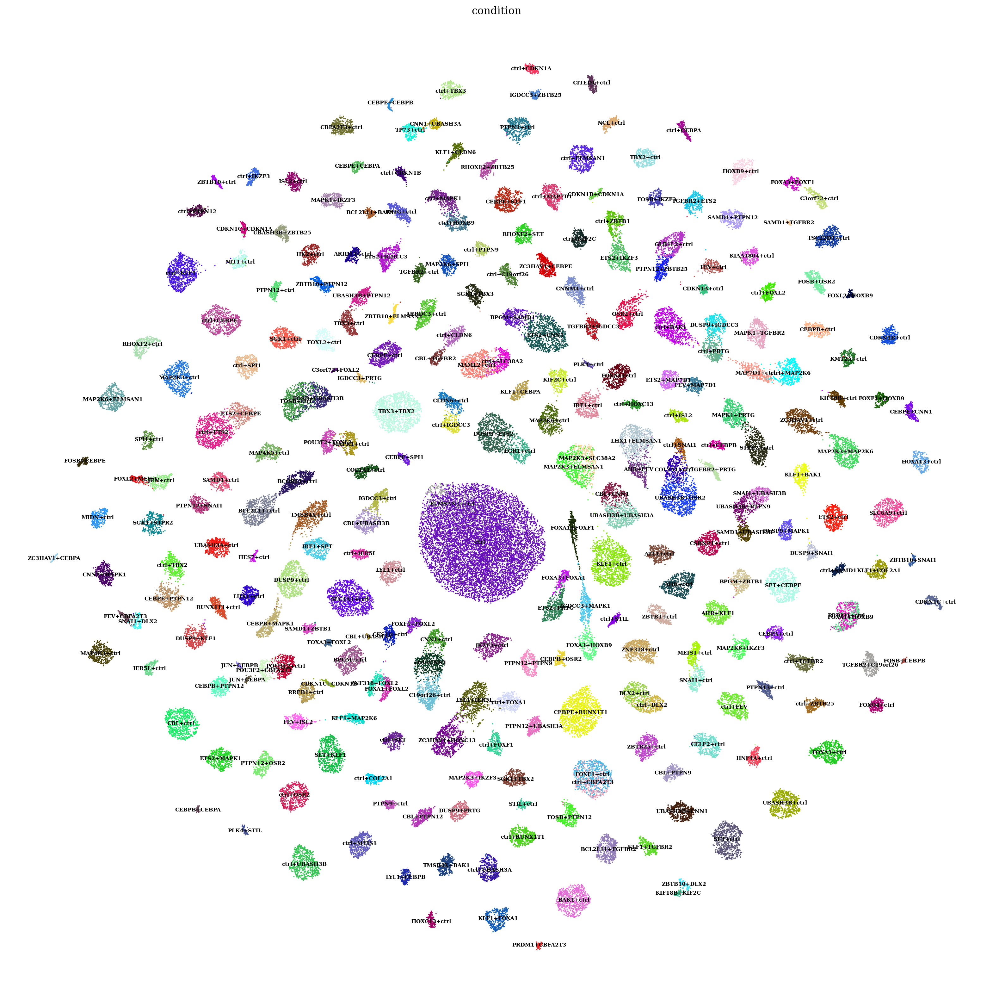

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

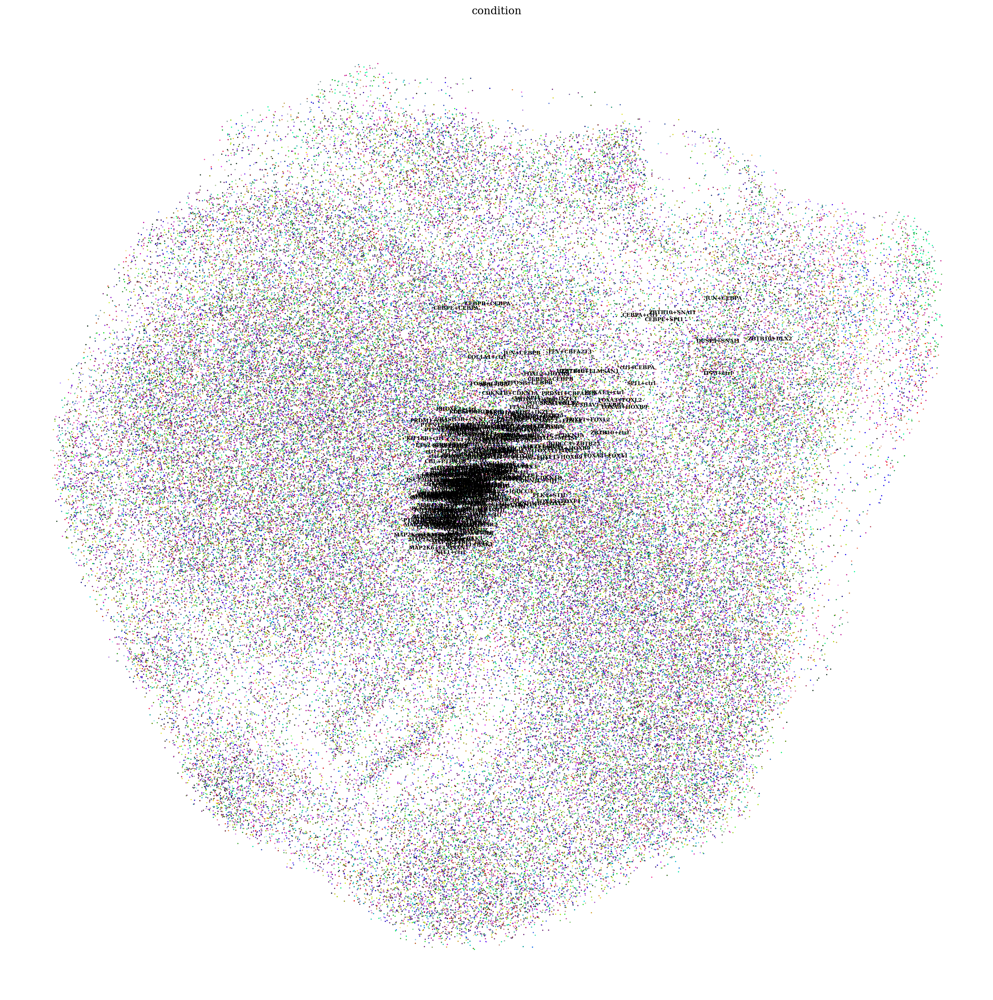

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()